In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import LinearRegression
import xgboost as xgb

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA

In [8]:
df = pd.read_excel("../Dados/imf-dm-export-20230513.xls")

## EDA

Primeiro, vamos separar os dados históricos dos preditos

In [9]:
df.head()

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028
0,Afghanistan,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,3.9,-2.4,no data,no data,no data,no data,no data,no data,no data,no data
1,Albania,2.7,5.7,2.9,1.1,2,-1.5,5.6,-0.8,-1.4,...,2.1,-3.5,8.5,3.7,2.2,3.3,3.4,3.4,3.4,3.4
2,Algeria,-5.4,3,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,1,-5.1,3.4,2.9,2.6,2.6,2.2,2.1,1.7,1.8
3,Andorra,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,2,-11.2,8.9,8.7,1.3,1.5,1.5,1.5,1.5,1.5
4,Angola,2.4,-4.4,0,4.2,6,3.5,2.9,4.1,6.1,...,-0.7,-5.6,1.1,2.8,3.5,3.7,4,4.1,4.2,4.2


In [10]:
Y = df.loc[:, 2024:2028]
Y.head()

,2024,2025,2026,2027,2028
0,no data,no data,no data,no data,no data
1,3.3,3.4,3.4,3.4,3.4
2,2.6,2.2,2.1,1.7,1.8
3,1.5,1.5,1.5,1.5,1.5
4,3.7,4,4.1,4.2,4.2


In [7]:
df = df.loc[:, :2023]
df.head()

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Afghanistan,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,2.7,1,2.2,2.6,1.2,3.9,-2.4,no data,no data,no data
1,Albania,2.7,5.7,2.9,1.1,2,-1.5,5.6,-0.8,-1.4,...,1.8,2.2,3.3,3.8,4,2.1,-3.5,8.5,3.7,2.2
2,Algeria,-5.4,3,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,3.8,3.7,3.2,1.4,1.2,1,-5.1,3.4,2.9,2.6
3,Andorra,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,2.5,1.4,3.7,0.3,1.6,2,-11.2,8.9,8.7,1.3
4,Angola,2.4,-4.4,0,4.2,6,3.5,2.9,4.1,6.1,...,4.8,0.9,-2.6,-0.2,-1.3,-0.7,-5.6,1.1,2.8,3.5


A análise exploratória, além do conhecimento sobre o comportamento dos dados, vai ser guiada pelo objetivo de traçar uma estratégia para o preeenchimento dos valores faltantes.

In [8]:
df.head()

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Afghanistan,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,2.7,1,2.2,2.6,1.2,3.9,-2.4,no data,no data,no data
1,Albania,2.7,5.7,2.9,1.1,2,-1.5,5.6,-0.8,-1.4,...,1.8,2.2,3.3,3.8,4,2.1,-3.5,8.5,3.7,2.2
2,Algeria,-5.4,3,6.4,5.4,5.6,5.6,-0.2,-0.7,-1.9,...,3.8,3.7,3.2,1.4,1.2,1,-5.1,3.4,2.9,2.6
3,Andorra,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,2.5,1.4,3.7,0.3,1.6,2,-11.2,8.9,8.7,1.3
4,Angola,2.4,-4.4,0,4.2,6,3.5,2.9,4.1,6.1,...,4.8,0.9,-2.6,-0.2,-1.3,-0.7,-5.6,1.1,2.8,3.5


In [9]:
df.tail()

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
225,Other advanced economies,3.8,4.2,2.2,4,6.6,4.3,5.5,6.5,5.5,...,3,2.3,2.6,3.1,2.8,2,-1.6,5.4,2.6,1.8
226,Sub-Saharan Africa,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,5,3.2,1.5,2.9,3.2,3.3,-1.7,4.8,3.9,3.6
227,World,2.1,1.9,0.7,2.6,4.6,3.6,3.6,3.9,4.7,...,3.5,3.4,3.3,3.8,3.6,2.8,-2.8,6.3,3.4,2.8
228,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
229,"©IMF, 2023",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
df.drop([228, 229], axis=0, inplace=True)
df.tail()

,Real GDP growth (Annual percent change),1980,1981,1982,1983,1984,1985,1986,1987,1988,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
223,Major advanced economies (G7),0.9,2,-0.1,3.3,5,3.8,3,3.5,4.7,...,1.9,2.1,1.5,2.2,2.1,1.6,-4.5,5.3,2.3,1.1
224,Middle East and Central Asia,-1.9,-0.2,0.4,0.7,0.3,1.2,2,-0.1,3.3,...,3.4,3,4.3,2.2,2.8,1.6,-2.7,4.6,5.3,2.9
225,Other advanced economies,3.8,4.2,2.2,4,6.6,4.3,5.5,6.5,5.5,...,3,2.3,2.6,3.1,2.8,2,-1.6,5.4,2.6,1.8
226,Sub-Saharan Africa,no data,no data,no data,no data,no data,no data,no data,no data,no data,...,5,3.2,1.5,2.9,3.2,3.3,-1.7,4.8,3.9,3.6
227,World,2.1,1.9,0.7,2.6,4.6,3.6,3.6,3.9,4.7,...,3.5,3.4,3.3,3.8,3.6,2.8,-2.8,6.3,3.4,2.8


In [11]:
df = df.rename(columns={"Real GDP growth (Annual percent change)": "Year"}) \
        .set_index("Year").T
df.head()

Year,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
1980,no data,2.7,-5.4,no data,2.4,8.2,0.7,no data,no data,2.9,...,-0.8,3.3,no data,1.8,6.4,0.9,-1.9,3.8,no data,2.1
1981,no data,5.7,3,no data,-4.4,3.8,-5.7,no data,no data,4.1,...,-0.5,1.9,no data,0.1,0.9,2,-0.2,4.2,no data,1.9
1982,no data,2.9,6.4,no data,0,-0.1,-3.1,no data,no data,0.1,...,1.4,1.5,no data,0.6,-0.5,-0.1,0.4,2.2,no data,0.7
1983,no data,1.1,5.4,no data,4.2,5.4,3.7,no data,no data,-0.5,...,4.6,1.8,no data,1.7,-2.8,3.3,0.7,4,no data,2.6
1984,no data,2,5.6,no data,6,10.2,2,no data,no data,6.3,...,4.1,4.1,no data,2.5,3.9,5,0.3,6.6,no data,4.6


In [12]:
df = df.replace("no data", np.nan)
df

Year,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
1980,NaN,2.7,-5.4,NaN,2.4,8.2,0.7,NaN,NaN,2.9,...,-0.8,3.3,NaN,1.8,6.4,0.9,-1.9,3.8,NaN,2.1
1981,NaN,5.7,3.0,NaN,-4.4,3.8,-5.7,NaN,NaN,4.1,...,-0.5,1.9,NaN,0.1,0.9,2.0,-0.2,4.2,NaN,1.9
1982,NaN,2.9,6.4,NaN,0.0,-0.1,-3.1,NaN,NaN,0.1,...,1.4,1.5,NaN,0.6,-0.5,-0.1,0.4,2.2,NaN,0.7
1983,NaN,1.1,5.4,NaN,4.2,5.4,3.7,NaN,NaN,-0.5,...,4.6,1.8,NaN,1.7,-2.8,3.3,0.7,4.0,NaN,2.6
1984,NaN,2.0,5.6,NaN,6.0,10.2,2.0,NaN,NaN,6.3,...,4.1,4.1,NaN,2.5,3.9,5.0,0.3,6.6,NaN,4.6
1985,NaN,-1.5,5.6,NaN,3.5,7.6,-7.0,NaN,NaN,5.5,...,2.4,3.5,NaN,2.2,3.2,3.8,1.2,4.3,NaN,3.6
1986,NaN,5.6,-0.2,NaN,2.9,11.5,7.1,NaN,NaN,2.4,...,4.4,4.3,NaN,2.7,4.3,3.0,2.0,5.5,NaN,3.6
1987,NaN,-0.8,-0.7,NaN,4.1,6.6,2.5,NaN,16.1,4.9,...,5.0,4.0,NaN,2.6,3.3,3.5,-0.1,6.5,NaN,3.9
1988,NaN,-1.4,-1.9,NaN,6.1,5.2,-2.0,NaN,18.6,4.3,...,1.6,4.5,NaN,3.8,1.1,4.7,3.3,5.5,NaN,4.7
1989,NaN,9.8,4.8,NaN,0.0,5.3,-7.0,NaN,12.1,4.6,...,0.1,3.5,NaN,3.6,1.1,3.8,4.3,4.6,NaN,3.8


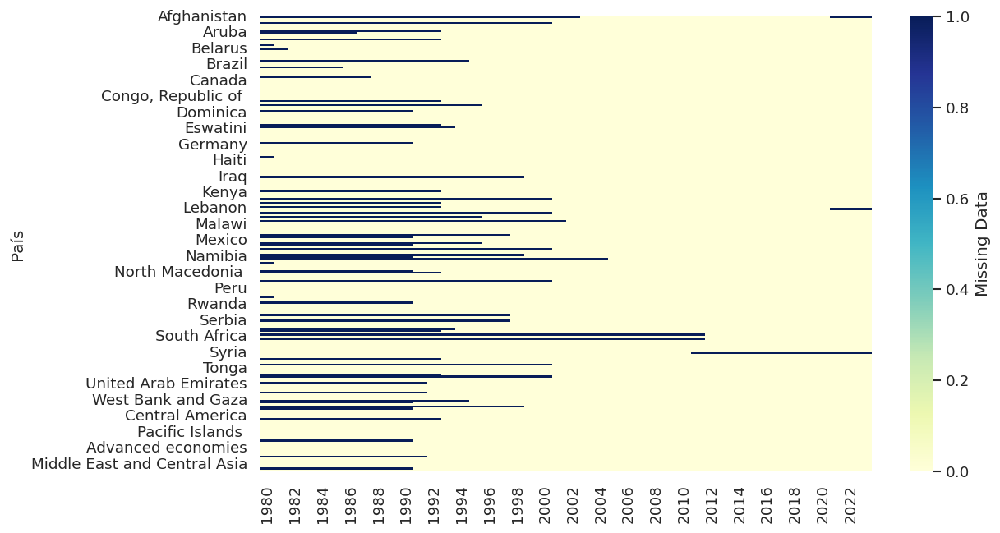

In [13]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df.isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.ylabel("País")

 Aqui, é possível notar que além de existir uma grande quantidade de valores faltantes, esses valores são recorrentes em períodos contíguos, e não dispersos sobre todo o período de análise, o que pode dificultar possível interpolações baseadas nos dados do próprios país.
 
 Dessa forma, é válido observar que pode ser vantajoso a análise por grupos econômicos, visto que esses grupos são formados por caracerísticas econômicas similares e cada participante possui determinada influência em seu grupo. Os grupos aqui listados são denominados de *Analytical Groups*, que podem ser encontrados em [IMF](https://www.imf.org/en/Publications/WEO/weo-database/2023/April/groups-and-aggregates).

 Para isso, é impotante que os dados de cada grupo tenha menos ou nenhum valor faltante, além disso, podemos utilizar a correlação entre países, desconsiderando proximidades geográficas e sim apenas fatores econômicos, visto que devido a economia globalizada, algums países possuem grandes influências em outros.

-  Séries Estacionárias

    - Ao aplicarmos um modelo de predição em uma série temporal, é impotante verificar se a série é estacionária. Tal característica é uma propriedade de que as estatísticas descritivas da série, como média e variância permanecem constantes ao longo do tempo.  A estacionariedade é importante porque muitos modelos assumem que a série é estacionária ou que pode ser transformada em uma série estacionária. Se a série não for estacionária, os modelos preditivos podem produzir resultados imprecisos ou enganosos

    - Existem diversas formas de verificar a estacionariedade uma série temporal, como visualmente ou por testes estatísticos, como o teste de [Dickey-Fuller](https://analisemacro.com.br/data-science/validacao-cruzada-de-series-temporais/), o qual será usado neste projeto devido ao caráter interativo para preenchiemnto dos modelos

In [14]:
def dickey_fuller_test(dataframe, column):
    series = dataframe[column].dropna()
    result = adfuller(series)
    return result[1]

In [15]:
def get_percentage_notnull(dataframe, column):
    notnull_values = dataframe[column].notnull().sum()
    total_values = len(dataframe[column])
    percentage = (notnull_values / total_values) * 100
    return percentage

In [16]:
def fill_missing_values_model(df, subset_columns, group, years_to_drop):
    
    correlation_matrix = df[subset_columns].corr()
    
    for column in subset_columns:
        missing_values = df[column].isnull()
        if missing_values.any():
            # get the countroy with higher correlation
            country_correlated = correlation_matrix[column].drop(column).idxmax()
            correlation = correlation_matrix.loc[column, country_correlated]
            # Measure the percentage of data present on that country
            notnull_percentage = get_percentage_notnull(df, country_correlated)
            # Take stats test if the time series about the country we will use
            # to train our model is stationary
            p_value = dickey_fuller_test(df, country_correlated)
            if  p_value < 0.05 and notnull_percentage >= 60 and correlation > 0.7:
                x = df[country_correlated].drop(years_to_drop)
                y = df[column].drop(years_to_drop)
                
                model = xgb.XGBRegressor(objective ='reg:absoluteerror', max_depth=3, eta=0.03, subsample=0.7)
                model.fit(x[y.notnull()].to_numpy().reshape(-1, 1), 
                          y[y.notnull()].to_numpy().reshape(-1, 1))
                
                y_predicted = model.predict(x[y.isnull()].to_numpy().reshape(-1, 1))
                df.loc[df[column].isnull(), column] = y_predicted.flatten()
            else:
                df = fill_missing_values_group_mean(df, column, group, years_to_drop)
                
    return df

In [17]:
def fill_missing_values_group_mean(df, column, group, years_to_drop):
    
    if(column == group):
        df[column] = df[column].fillna(df[column].median())
        return df
    
    df_aux = df[[column, group]].drop(years_to_drop)
    mean_distance = (df_aux[column] - df_aux[group]).mean()
    
    df[column] = df[column].fillna(df[group] + mean_distance)
    return df

In [171]:
analytical_group = {
        "Major advanced economies (G7)": [
            "Canada",
            "France",
            "Germany",
            "Italy",
            "Japan",
            "United Kingdom",
            "United States",
            "Major advanced economies (G7)"
        ],
        "Asean-5": [
            "Indonesia",
            "Malaysia",
            "Philippines",
            "Singapore",
            "Thailand",
            "ASEAN-5"
        ],
        "Other advanced economies": [
            "Andorra",
            "Australia",
            "Czech Republic",
            "Denmark",
            "Hong Kong SAR",
            "Iceland",
            "Israel",
            "Macao SAR",
            "New Zealand",
            "Norway",
            "Puerto Rico",
            "San Marino",
            "Singapore",
            "Sweden",
            "Switzerland",
            "Taiwan Province of China",
            "Other advanced economies",
        ],
        "European Union": [
            "Austria",
            "Belgium",
            "Bulgaria",
            "Croatia",
            "Cyprus",
            "Czech Republic",
            "Denmark",
            "Estonia",
            "Finland",
            "France",
            "Germany",
            "Greece",
            "Hungary",
            "Ireland",
            "Italy",
            "Latvia",
            "Lithuania",
            "Luxembourg",
            "Malta",
            "Netherlands",
            "Poland",
            "Portugal",
            "Romania",
            "Slovak Republic",
            "Slovenia",
            "Spain",
            "Sweden",
            "European Union",
        ],
        "Emerging market and developing economies": [
            "Afghanistan",
            "Albania",
            "Algeria",
            "Angola",
            "Antigua and Barbuda",
            "Argentina",
            "Armenia",
            "Aruba",
            "Azerbaijan",
            "Bahamas, The",
            "Bahrain",
            "Bangladesh",
            "Barbados",
            "Belarus",
            "Belize",
            "Benin",
            "Bhutan",
            "Bolivia",
            "Bosnia and Herzegovina",
            "Botswana",
            "Brazil",
            "Brunei Darussalam",
            "Bulgaria",
            "Burkina Faso",
            "Burundi",
            "Cabo Verde",
            "Cambodia",
            "Cameroon",
            "Central African Republic",
            "Chad",
            "Chile",
            "China, People's Republic of",
            "Colombia",
            "Comoros",
            "Congo, Dem. Rep. of the",
            "Congo, Republic of ",
            "Costa Rica",
            "Côte d'Ivoire",
            "Djibouti",
            "Dominica",
            "Dominican Republic",
            "Ecuador",
            "Egypt",
            "El Salvador",
            "Equatorial Guinea",
            "Eritrea",
            "Eswatini",
            "Ethiopia",
            "Fiji",
            "Gabon",
            "Gambia, The",
            "Georgia",
            "Ghana",
            "Grenada",
            "Guatemala",
            "Guinea",
            "Guinea-Bissau",
            "Guyana",
            "Haiti",
            "Honduras",
            "Hungary",
            "India",
            "Indonesia",
            "Iran",
            "Iraq",
            "Jamaica",
            "Jordan",
            "Kazakhstan",
            "Kenya",
            "Kiribati",
            "Kosovo",
            "Kuwait",
            "Kyrgyz Republic",
            "Lao P.D.R.",
            "Lebanon",
            "Lesotho",
            "Liberia",
            "Libya",
            "Madagascar",
            "Malawi",
            "Malaysia",
            "Maldives",
            "Mali",
            "Marshall Islands",
            "Mauritania",
            "Mauritius",
            "Mexico",
            "Micronesia, Fed. States of",
            "Moldova",
            "Mongolia",
            "Montenegro",
            "Morocco",
            "Mozambique",
            "Myanmar",
            "Namibia",
            "Nauru",
            "Nepal",
            "Nicaragua",
            "Niger",
            "Nigeria",
            "North Macedonia ",
            "Oman",
            "Pakistan",
            "Palau",
            "Panama",
            "Papua New Guinea",
            "Paraguay",
            "Peru",
            "Philippines",
            "Poland",
            "Qatar",
            "Romania",
            "Russian Federation",
            "Rwanda",
            "Samoa",
            "São Tomé and Príncipe",
            "Saudi Arabia",
            "Senegal",
            "Serbia",
            "Seychelles",
            "Sierra Leone",
            "Solomon Islands",
            "Somalia",
            "South Africa",
            "South Sudan, Republic of",
            "Sri Lanka",
            "Saint Kitts and Nevis",
            "Saint Lucia",
            "Saint Vincent and the Grenadines",
            "Sudan",
            "Suriname",
            "Syria",
            "Tajikistan",
            "Tanzania",
            "Thailand",
            "Timor-Leste",
            "Togo",
            "Tonga",
            "Trinidad and Tobago",
            "Tunisia",
            "Türkiye, Republic of",
            "Turkmenistan",
            "Tuvalu",
            "Uganda",
            "Ukraine",
            "United Arab Emirates",
            "Uruguay",
            "Uzbekistan",
            "Vanuatu",
            "Venezuela",
            "Vietnam",
            "West Bank and Gaza",
            "Yemen",
            "Zambia",
            "Zimbabwe",
            "Emerging market and developing economies"
        ],
        "Emerging and Developing Asia": [
            "Bangladesh",
            "Bhutan",
            "Brunei Darussalam",
            "Cambodia",
            "China, People's Republic of",
            "Fiji",
            "India",
            "Indonesia",
            "Kiribati",
            "Lao P.D.R.",
            "Malaysia",
            "Maldives",
            "Marshall Islands",
            "Micronesia, Fed. States of",
            "Mongolia",
            "Emerging and Developing Asia"
        ],
        "Emerging and Developing Europe": [
            "Albania",
            "Belarus",
            "Bosnia and Herzegovina",
            "Bulgaria",
            "Hungary",
            "Kosovo",
            "Moldova",
            "Montenegro",
            "North Macedonia ",
            "Poland",
            "Romania",
            "Russian Federation",
            "Serbia",
            "Türkiye, Republic of",
            "Ukraine",
            "Emerging and Developing Europe"
        ],
        "Latin America and the Caribbean": [
            "Antigua and Barbuda",
            "Argentina",
            "Aruba",
            "Bahamas, The",
            "Barbados",
            "Belize",
            "Bolivia",
            "Brazil",
            "Chile",
            "Colombia",
            "Costa Rica",
            "Dominica",
            "Dominican Republic",
            "Ecuador",
            "El Salvador",
            "Grenada",
            "Guatemala",
            "Guyana",
            "Haiti",
            "Honduras",
            "Jamaica",
            "Mexico",
            "Nicaragua",
            "Panama",
            "Paraguay",
            "Peru",
            "Saint Kitts and Nevis",
            "Saint Lucia",
            "Saint Vincent and the Grenadines",
            "Suriname",
            "Trinidad and Tobago",
            "Uruguay",
            "Venezuela",
            "Latin America and the Caribbean"
        ],
        "Middle East and Central Asia": [
            "Afghanistan",
            "Algeria",
            "Armenia",
            "Azerbaijan",
            "Bahrain",
            "Djibouti",
            "Egypt",
            "Georgia",
            "Iran",
            "Iraq",
            "Jordan",
            "Kazakhstan",
            "Kuwait",
            "Kyrgyz Republic",
            "Lebanon",
            "Libya",
            "Mauritania",
            "Morocco",
            "Oman",
            "Pakistan",
            "Qatar",
            "Saudi Arabia",
            "Somalia",
            "Sudan",
            "Syria",
            "Tajikistan",
            "Tunisia",
            "Turkmenistan",
            "United Arab Emirates",
            "Uzbekistan",
            "West Bank and Gaza",
            "Yemen",
        ],
        "Sub-Saharan Africa": [
            "Angola",
            "Benin",
            "Botswana",
            "Burkina Faso",
            "Burundi",
            "Cabo Verde",
            "Cameroon",
            "Central African Republic",
            "Chad",
            "Comoros",
            "Congo, Dem. Rep. of the",
            "Congo, Republic of ",
            "Côte d'Ivoire",
            "Equatorial Guinea",
            "Eritrea",
            "Eswatini",
            "Ethiopia",
            "Gabon",
            "Gambia, The",
            "Ghana",
            "Guinea",
            "Guinea-Bissau",
            "Kenya",
            "Lesotho",
            "Liberia",
            "Madagascar",
            "Malawi",
            "Mali",
            "Mauritius",
            "Mozambique",
            "Namibia",
            "Niger",
            "Nigeria",
            "Rwanda",
            "São Tomé and Príncipe",
            "Senegal",
            "Seychelles",
            "Sierra Leone",
            "South Africa",
            "South Sudan, Republic of",
            "Tanzania",
            "Togo",
            "Uganda",
            "Zambia",
            "Zimbabwe",
            "Sub-Saharan Africa",
        ]
}

### Análise de cada grupo enocônimo/analítico e prenchimento dos valores faltantes

#### Major advanced economies (G7)

In [19]:
df[analytical_group["Major advanced economies (G7)"]].head()

Year,Canada,France,Germany,Italy,Japan,United Kingdom,United States,Major advanced economies (G7)
1980,2.2,1.8,1.3,3.1,3.2,-2.2,-0.3,0.9
1981,3.5,1.1,0.1,0.6,4.2,-0.9,2.5,2.0
1982,-3.2,2.5,-0.8,0.2,3.3,1.7,-1.8,-0.1
1983,2.6,1.3,1.6,0.9,3.5,3.9,4.6,3.3
1984,5.9,1.6,2.8,3.0,4.5,1.9,7.2,5.0


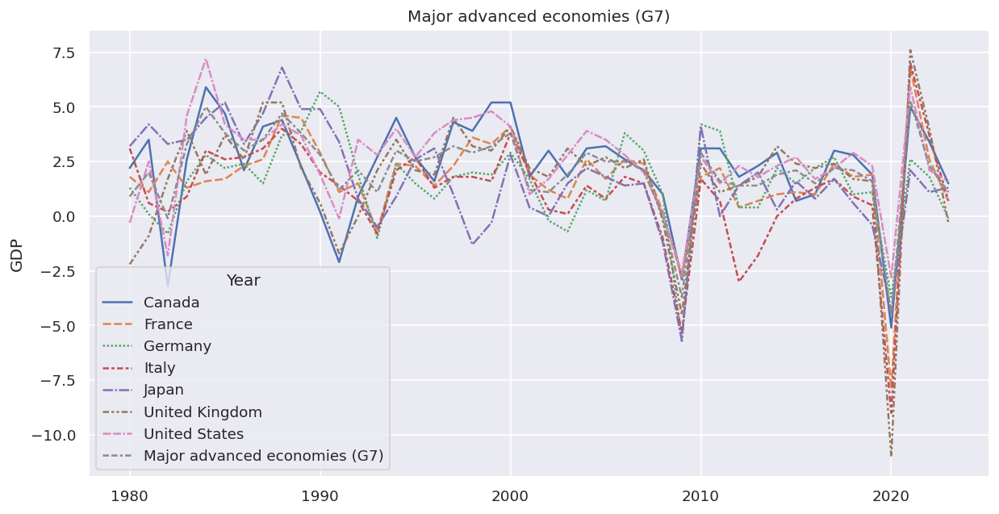

In [20]:
sns.lineplot(df[analytical_group["Major advanced economies (G7)"]]).plot()
plt.title("Major advanced economies (G7)")
plt.ylabel("GDP")
plt.show()

Para as 7 maiores economias do mundo, podemos observar alguns vales que pode inteferir para o preenchimento dos dados com modelos preditivos.

Existem grandes vales nos anos de 2020 e 2009, ambos por fatores atípicos como o corona vírus e a Grande Recessão de 2009. Dessa forma, a depender do comportamento dos dados, pode ser útil retirar tais amostras devido ao caráter não sistêmico, ou permanecer para observar a influência na queda da economia de alguns países em outros.

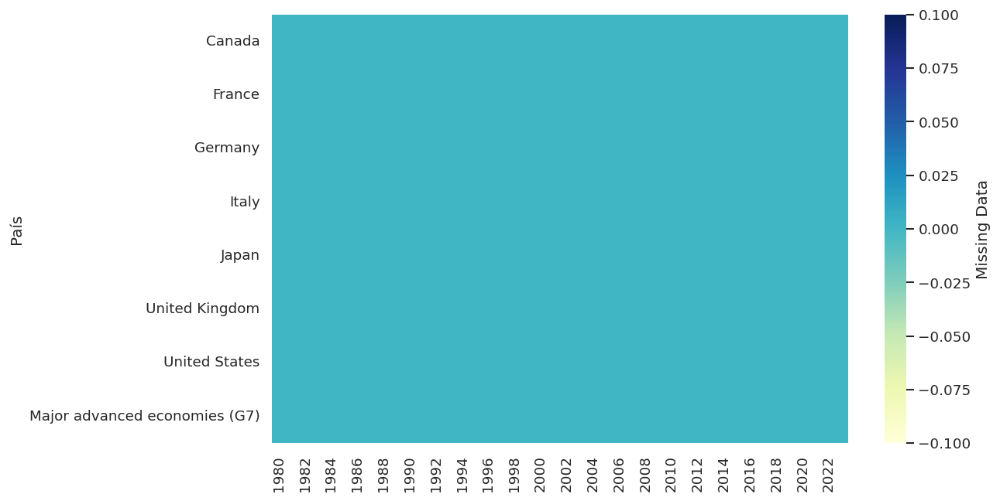

In [21]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["Major advanced economies (G7)"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.ylabel("País")

- Não há registros de valores faltantes no G7

#### Asean-5

In [22]:
df[analytical_group["Asean-5"]].head()

Year,Indonesia,Malaysia,Philippines,Singapore,Thailand,ASEAN-5
1980,9.9,7.4,5.1,10.1,4.6,7.7
1981,7.6,6.9,3.4,10.8,5.9,6.5
1982,2.2,5.9,3.6,7.1,5.4,3.8
1983,4.2,6.3,1.9,8.6,5.6,4.5
1984,7.6,7.8,-7.3,8.8,5.8,4.6


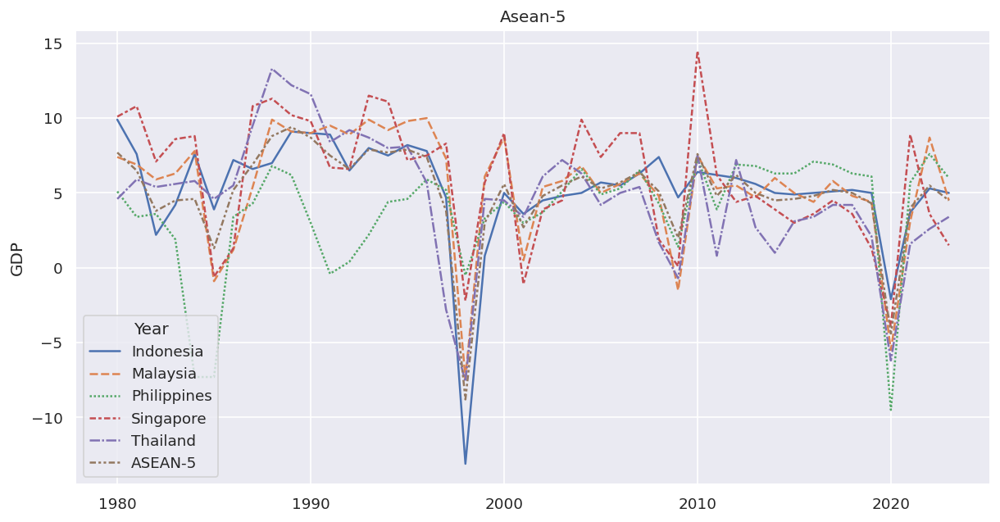

In [23]:
sns.lineplot(df[analytical_group["Asean-5"]]).plot()
plt.title("Asean-5")
plt.ylabel("GDP")
plt.show()

Aqui, observamos que o TOP-5 dos países asiáticos, sofreram menos nas crises de 2009 e 2020, porém, é possível notar um grande vale próximo dos anos 2000, muito devido à grande crise ocorrida no Sudeste e Oriente Asiático no ano de 1997, que assim como o descrito no G-7, cabe a análise da retirada desses valores para o imputar dados de outros países ou até mesmo para a modelagem final.

VVáliso ressaltar também como as Phillippines possui valores discrepantes do grupo até meados dos anos 90, e grandes picos em Singapore a partir dos anos 2000.

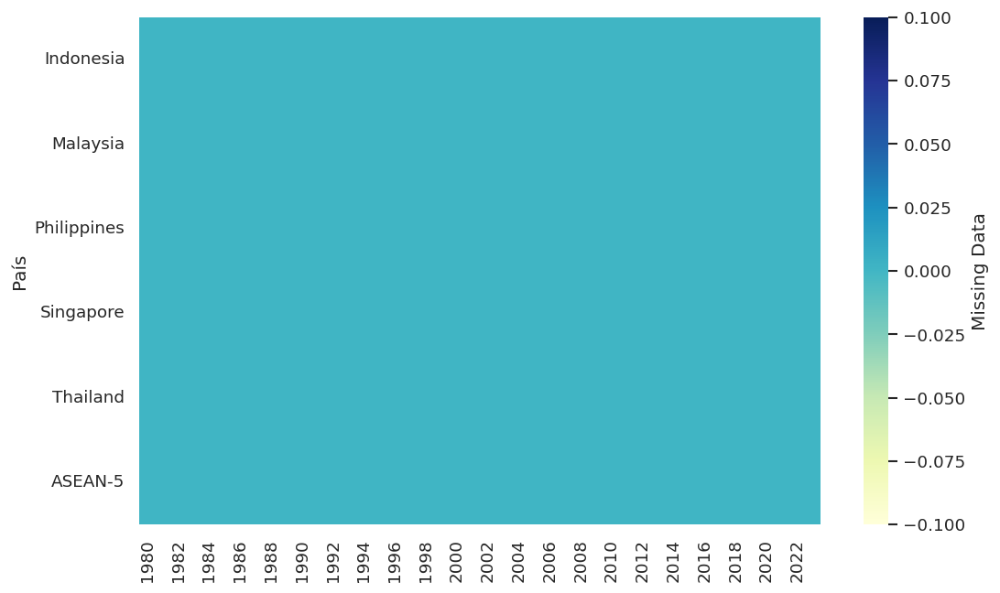

In [24]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["Asean-5"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.ylabel("País")

- Também não é observado valores faltantes neste grupo

#### Other advanced economies

In [25]:
df[analytical_group["Other advanced economies"]].head()

Year,Andorra,Australia,Czech Republic,Denmark,Hong Kong SAR,Iceland,Israel,Macao SAR,New Zealand,Norway,Puerto Rico,San Marino,Singapore,Sweden,Switzerland,Taiwan Province of China,Other advanced economies
1980,NaN,2.9,NaN,-0.5,10.3,5.7,3.6,NaN,1.0,4.5,NaN,NaN,10.1,4.6,5.1,8.0,3.8
1981,NaN,4.1,NaN,-0.7,9.2,4.3,4.7,NaN,3.0,1.6,1.1,NaN,10.8,4.5,1.6,7.1,4.2
1982,NaN,0.1,NaN,3.7,2.9,2.2,1.4,NaN,2.9,0.2,-3.0,NaN,7.1,1.4,-1.3,4.8,2.2
1983,NaN,-0.5,NaN,2.6,6.0,-2.2,2.6,NaN,-0.1,4.0,0.5,NaN,8.6,2.1,0.6,9.0,4.0
1984,NaN,6.3,NaN,4.2,10.0,4.1,2.2,NaN,6.9,6.1,7.3,NaN,8.8,4.3,3.1,10.0,6.6


- Checagem do comportamento dos dados do grupo

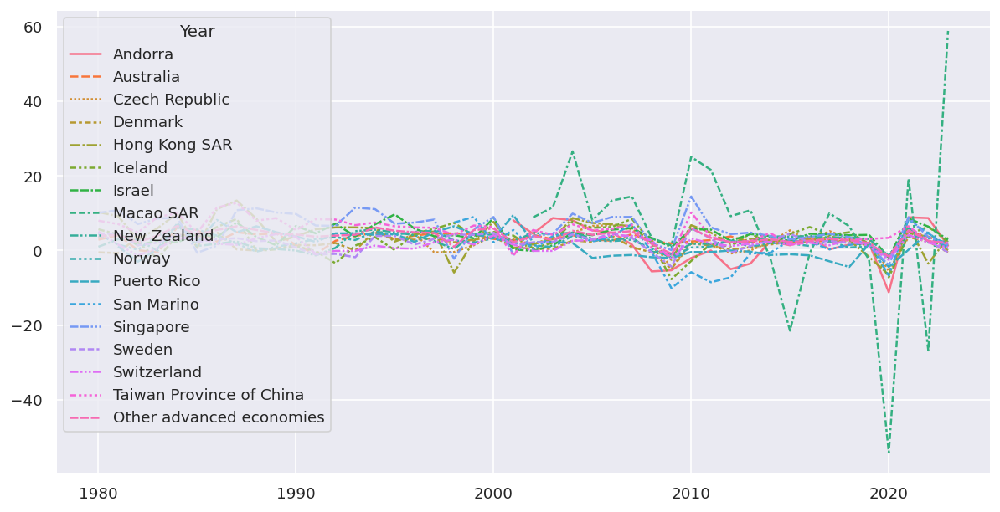

In [26]:
sns.lineplot(df[analytical_group["Other advanced economies"]]).plot()
plt.show()

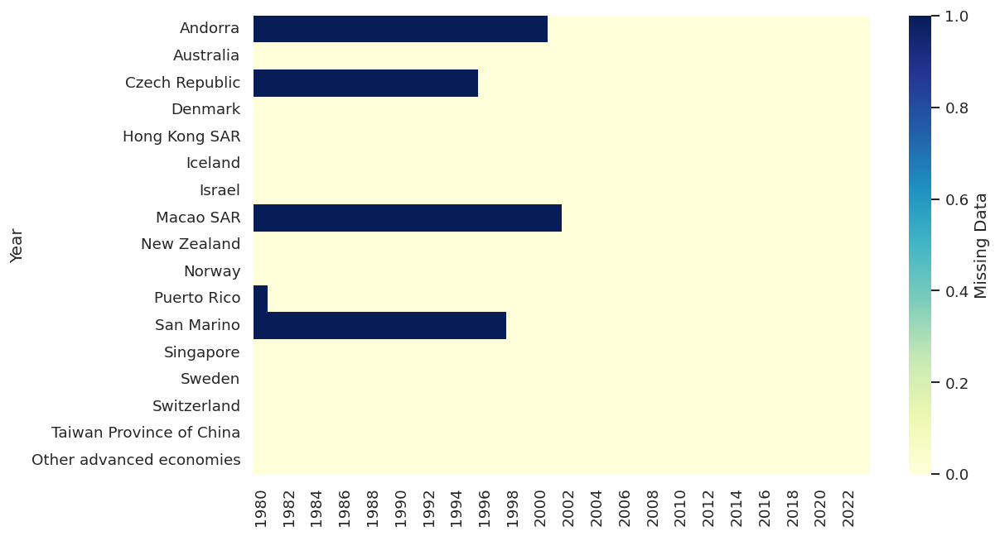

In [27]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["Other advanced economies"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})

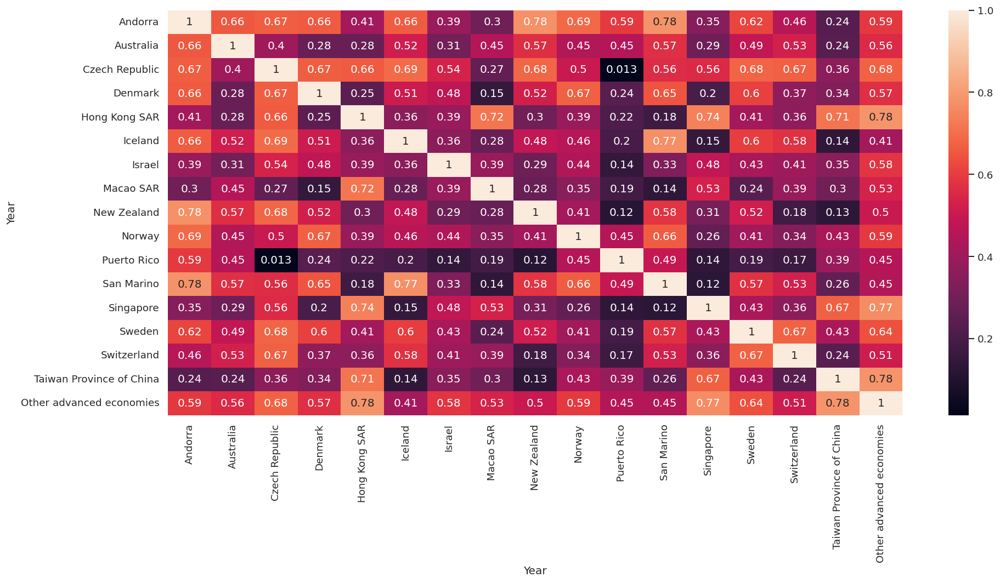

In [28]:
plt.figure(figsize=(18,8))
sns.heatmap(df[analytical_group["Other advanced economies"]].corr(), annot=True)
plt.show()

- Dentro do grupo de "Other advanced economies" é possível notar que, este indicador em si não possui valores faltantes, porém os países com valores faltantes não estão fortemente correlacionados com o indicador geral, podendo ser usado dessa forma a correlação entre países. Como veremos a seguir

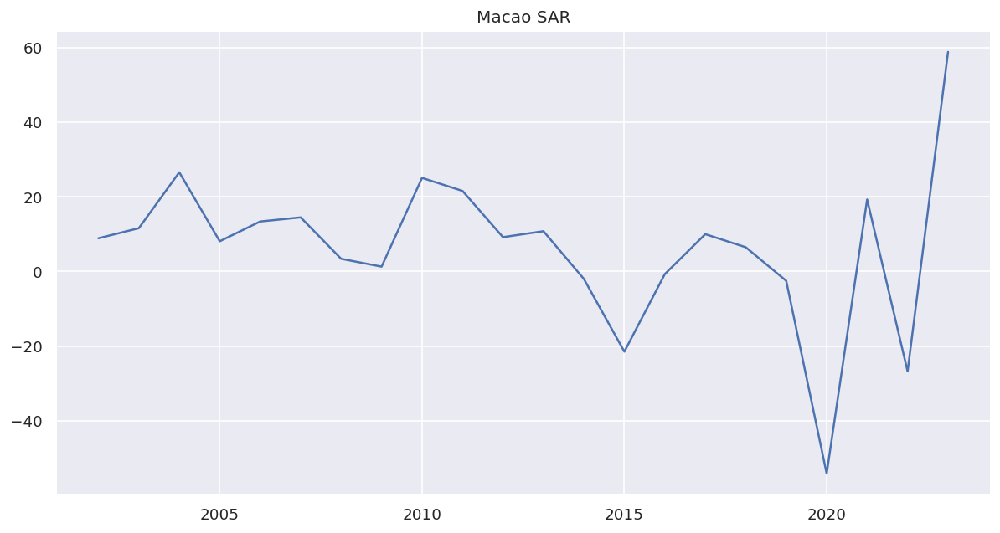

In [29]:
df["Macao SAR"].plot()
plt.title("Macao SAR")
plt.show()

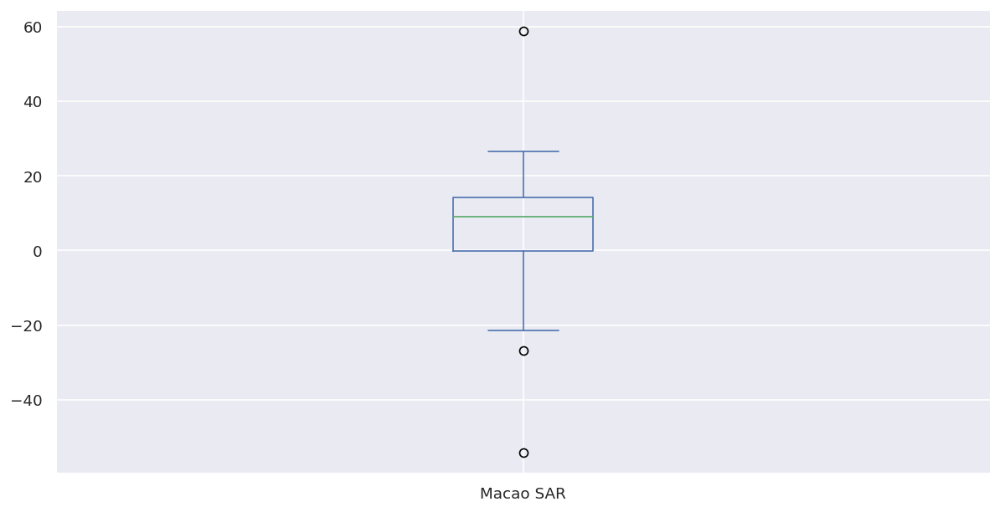

In [30]:
df[["Macao SAR"]].plot(kind="box")

- Notamos que, para o País de Macao os valores saem bastante da distribuição observada para todo o grupo. Podendo ser tratado com outras estratégias.
- Apesar e correlação observada no gráfico de heatmap acima, o preenchimento por um modelo estatístico levando em consideração a economia de Hong Kong pode ter batsante ruído devido a pequena e instáveis observações. Dessa forma, é válido preencher com a média do grupo.

In [31]:
df = fill_missing_values_group_mean(df, "Macao SAR", "Other advanced economies", [2020, 2023])

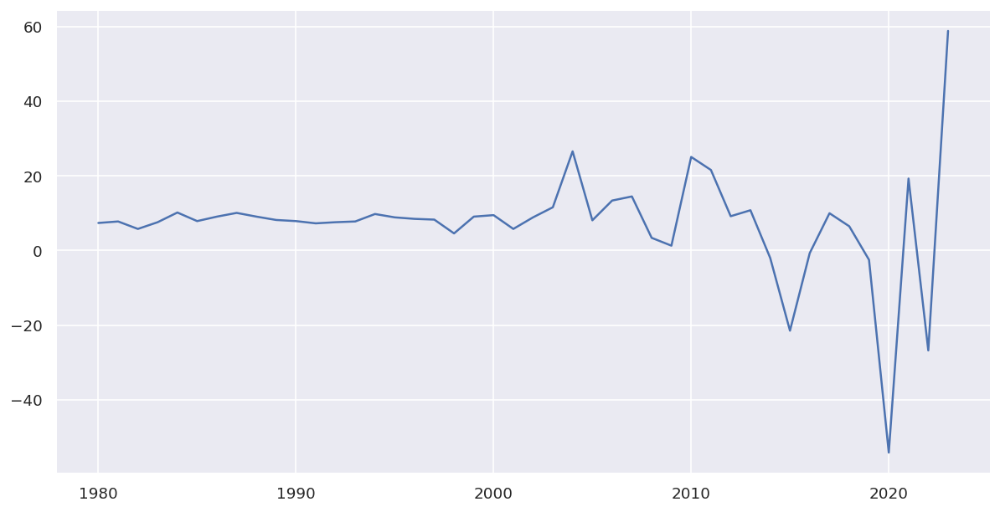

In [32]:
df["Macao SAR"].plot()

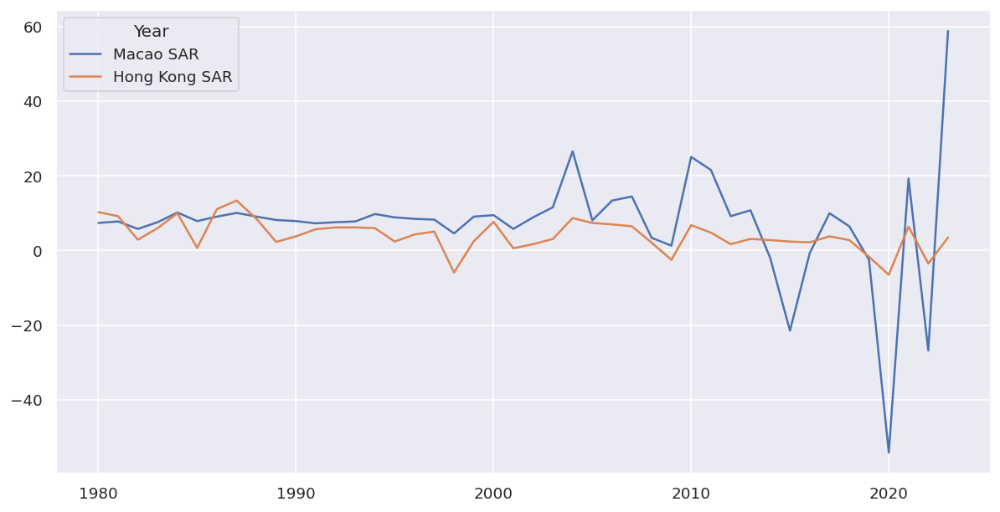

In [33]:
df[["Macao SAR", "Hong Kong SAR"]].plot()

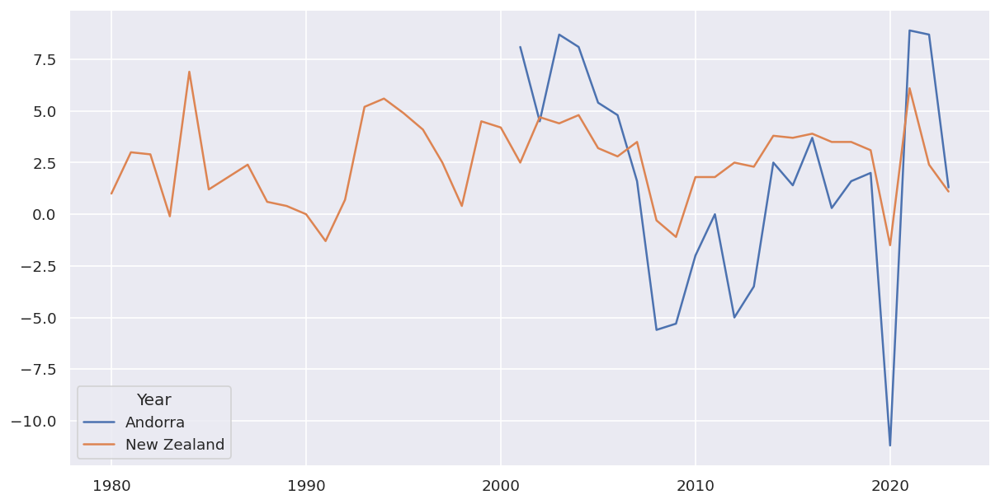

In [34]:
df[["Andorra", "New Zealand"]].plot()

- Assim como Macao, o país de Andorra possui poucas observações, além diversos picos e vales, dessa forma a mesma estratégia será tratada de preencher os valores faltantes diretamente com a média do grupo, desconsiderando o ano de pandemia.

In [35]:
df = fill_missing_values_group_mean(df, "Andorra", "Other advanced economies", [2020])

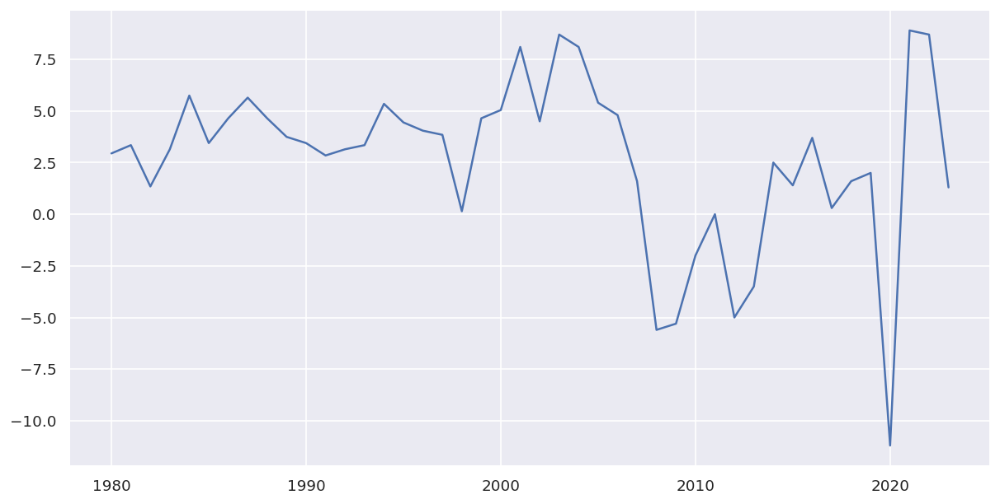

In [36]:
df["Andorra"].plot()

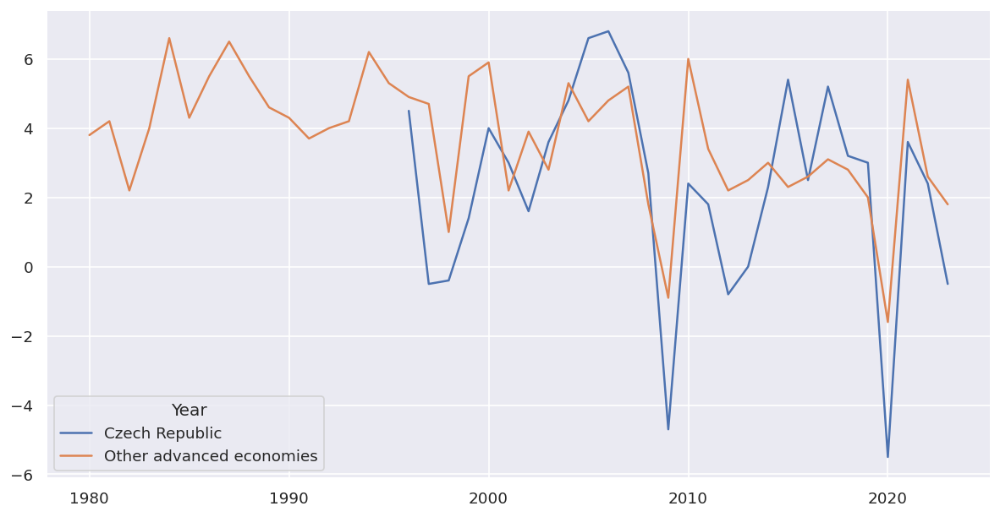

In [37]:
df[["Czech Republic", "Other advanced economies"]].plot()

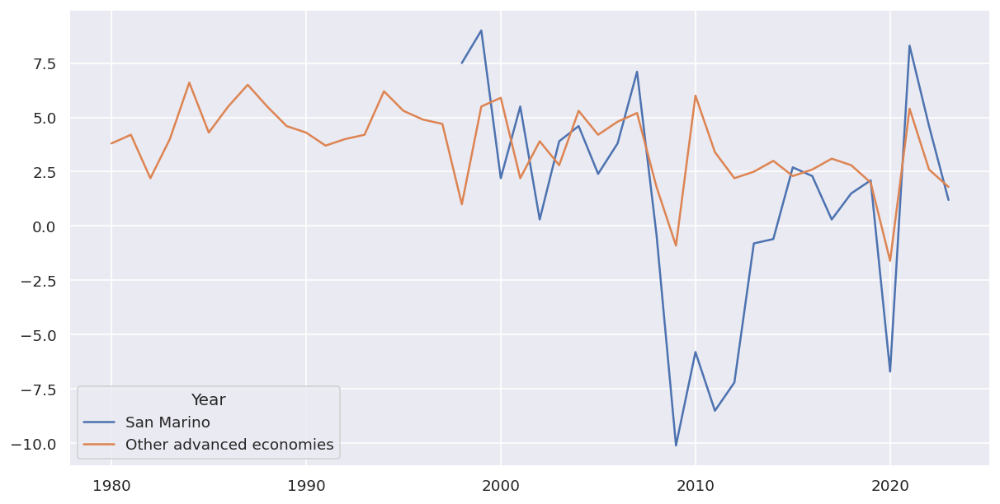

In [38]:
df[["San Marino", "Other advanced economies"]].plot()

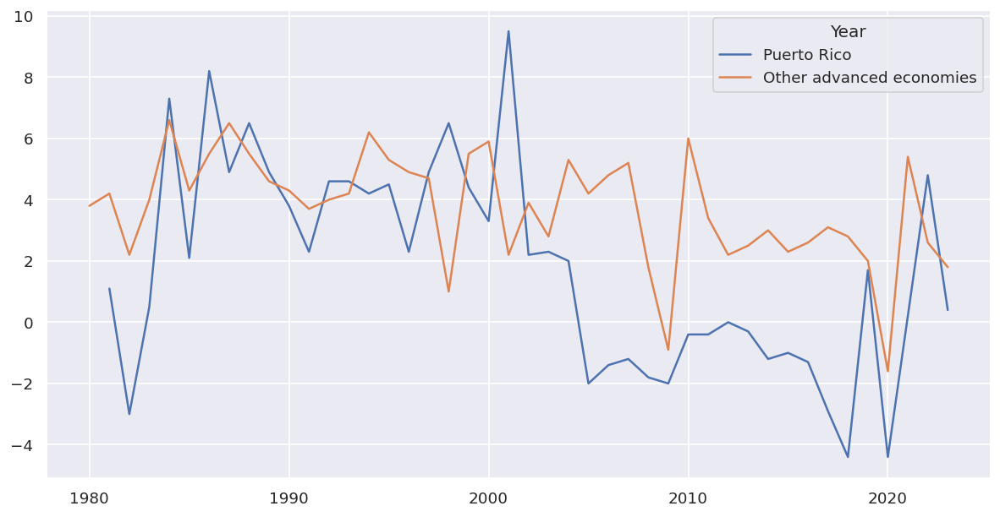

In [39]:
df[["Puerto Rico", "Other advanced economies"]].plot()

- Dos países restantes, vemos que San Marino e República Tcheca sofreram bastante tanto com a pandemia quanto com a crise de 2009, o páis de San Marino possui baixas correlações com todos os outros países do grupo, podendo ser tratado com o preenchimento com a média do grupo.

In [40]:
df = fill_missing_values_model(df, 
                          analytical_group["Other advanced economies"], 
                          "Other advanced economies", 
                          [2020, 2009])

- Assim temos todos os dados de outras economias avanãdas preenchidos.

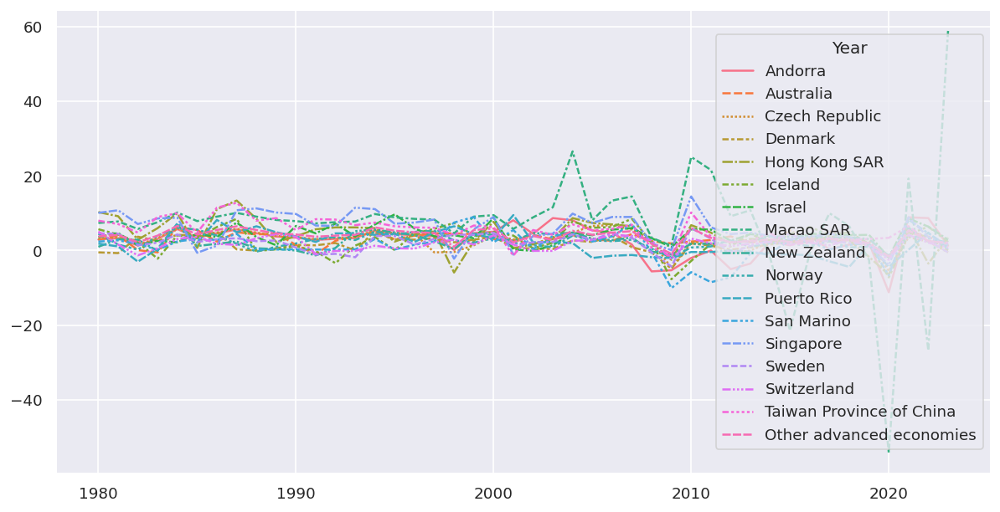

In [41]:
sns.lineplot(df[analytical_group["Other advanced economies"]]).plot()
plt.show()

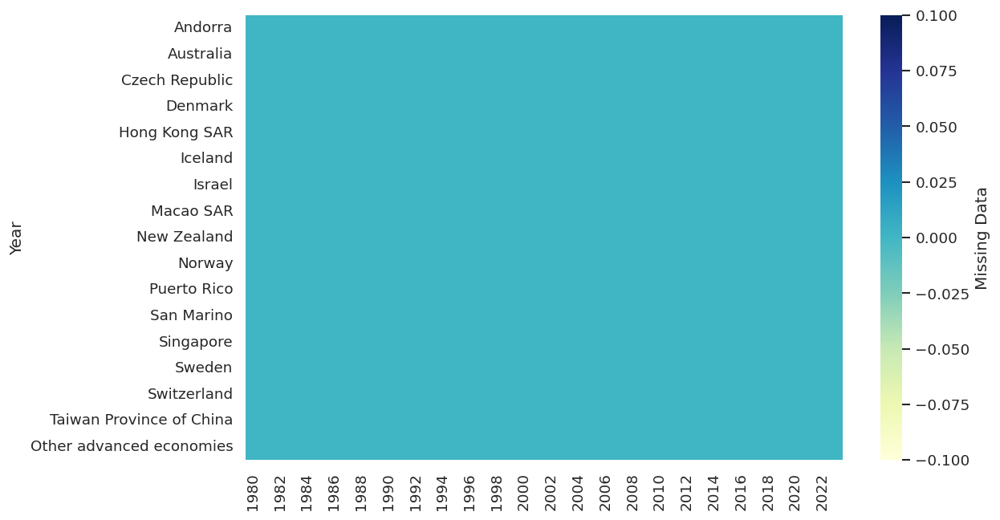

In [42]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["Other advanced economies"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})

#### Emerging and Developing Europe

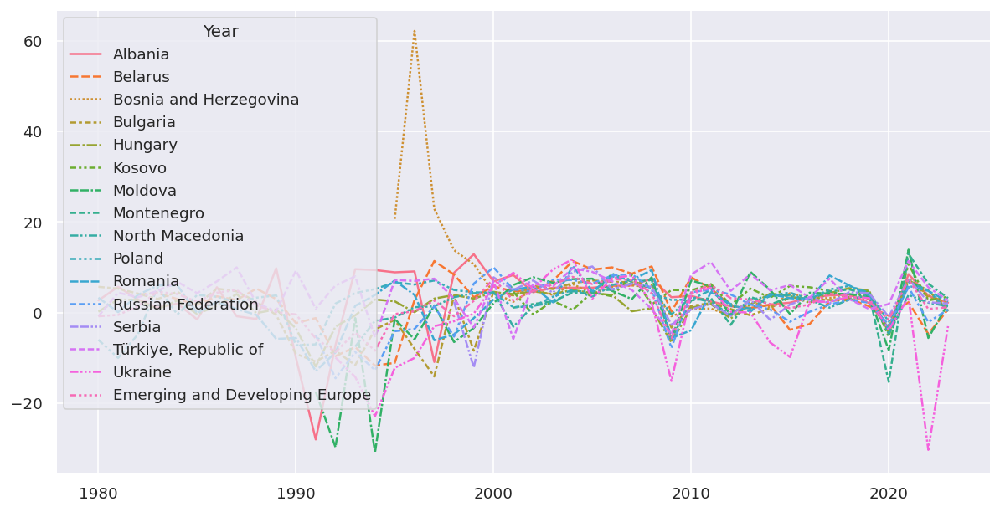

In [43]:
sns.lineplot(df[analytical_group["Emerging and Developing Europe"]]).plot()
plt.show()

- Analisando o gráfico acima, podemos imediatamente notar um grande outlier logo no início dos dados de Bosnia and Herzegovina, além de um grande vale na Ucrância, muito devido sua guerra com a Rússia, tais observações devem ser levadas em conta ao realizar o preenchimento dos dandos, tanto com modelos quanto como médias, pois tais outliers podem impactar na performance de ambos.

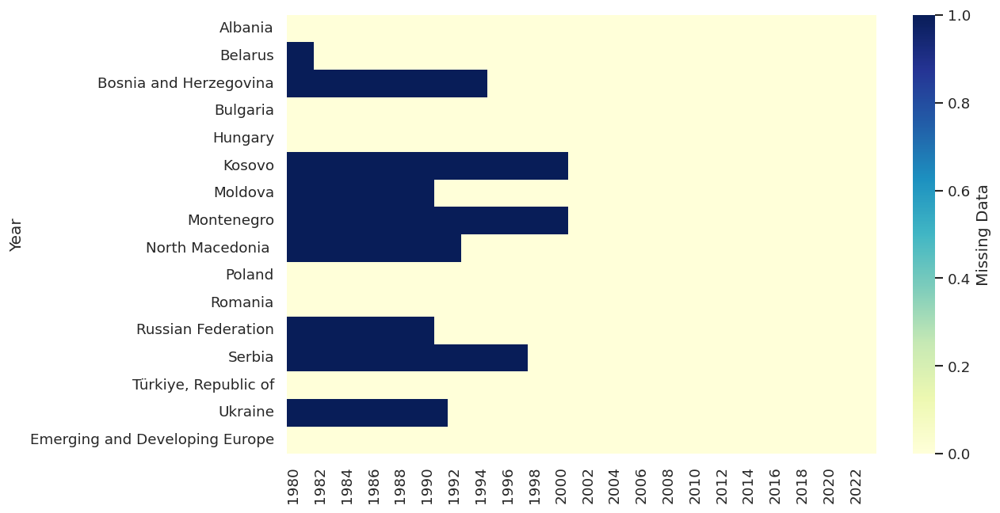

In [44]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["Emerging and Developing Europe"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})

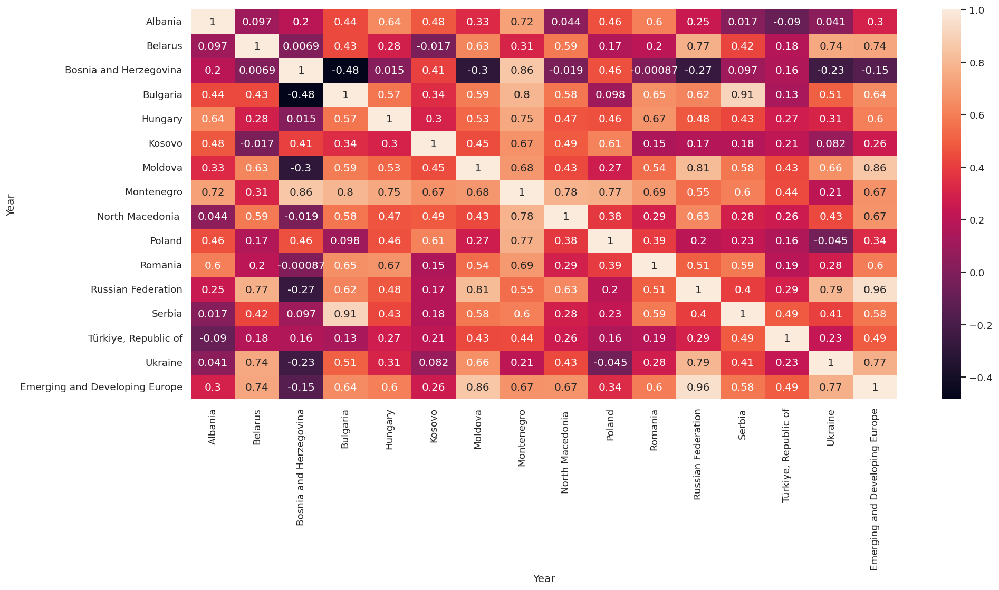

In [45]:
plt.figure(figsize=(18,8))
sns.heatmap(df[analytical_group["Emerging and Developing Europe"]].corr(), annot=True)
plt.show()

- Aqui, mais da metado dos países deste grupo possuem valores faltantes.
- O país de Kosovo contém correlações fracas entre os demais países do grupo

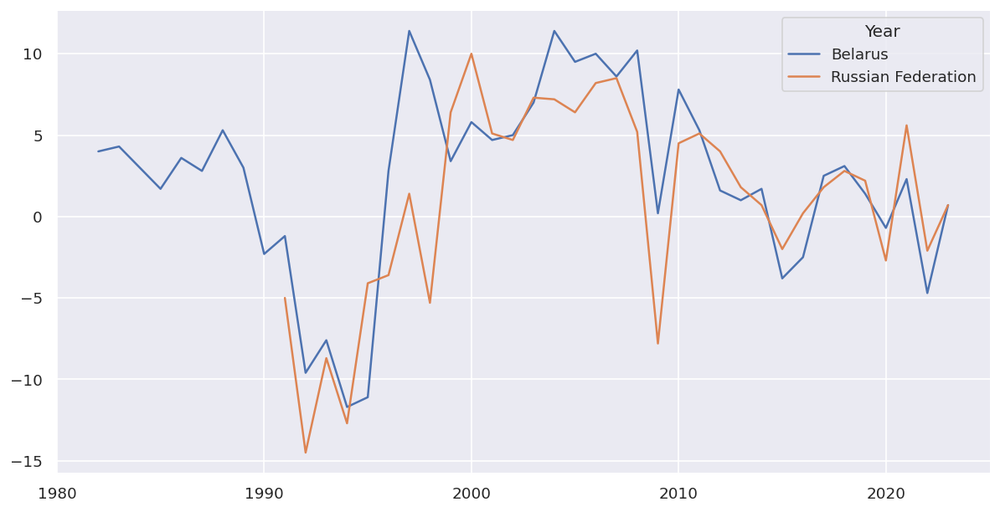

In [46]:
df[["Belarus", "Russian Federation"]].plot()

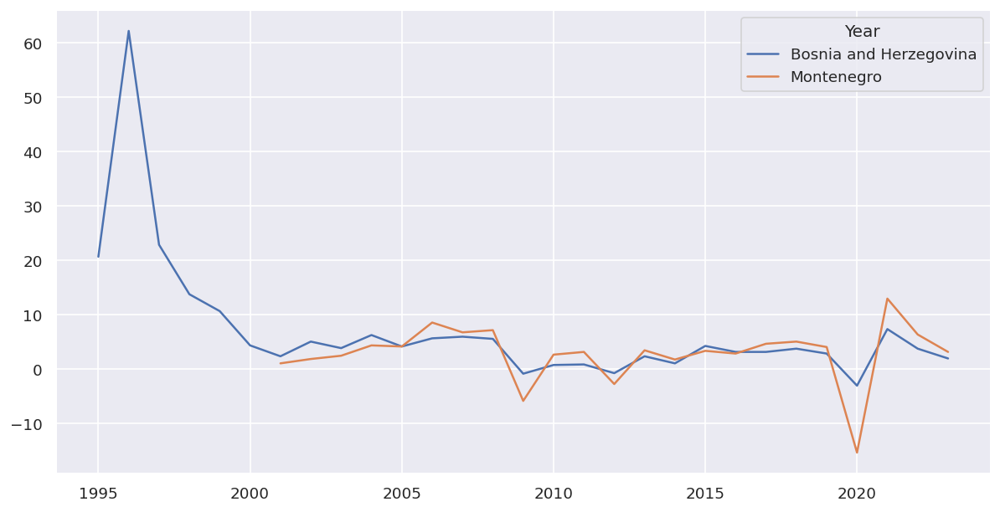

In [47]:
df[["Bosnia and Herzegovina", "Montenegro"]].plot()

- Nota-ss que, após a existência de dados do país de Montenegro, seu GPD caminha bastante próximo com o da Bosnia. O país de Montenegro também apresenta uma queda na pandemia

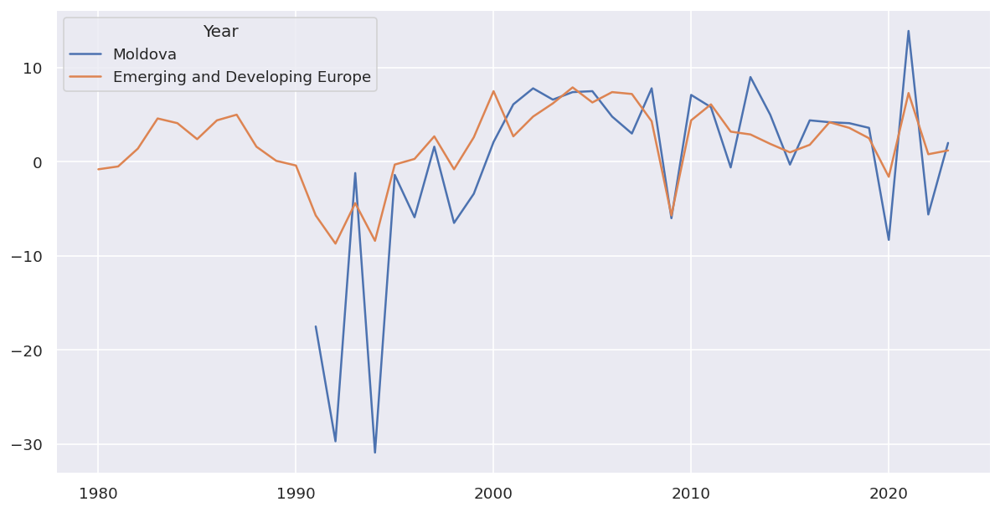

In [48]:
df[["Moldova", "Emerging and Developing Europe"]].plot()

- O país de Moldava possui uma alta correlação com o GDP do seu grupo, porém, existem valores bastante discrepantes nos anos de 1991, 1992 e 1994. Assim vale seu tratamento em particular, excluido estes vales dos dados.

In [49]:
df = fill_missing_values_model(df, 
                          ["Moldova", "Emerging and Developing Europe"], 
                          "Emerging and Developing Europe", 
                          [1991, 1992, 1994])

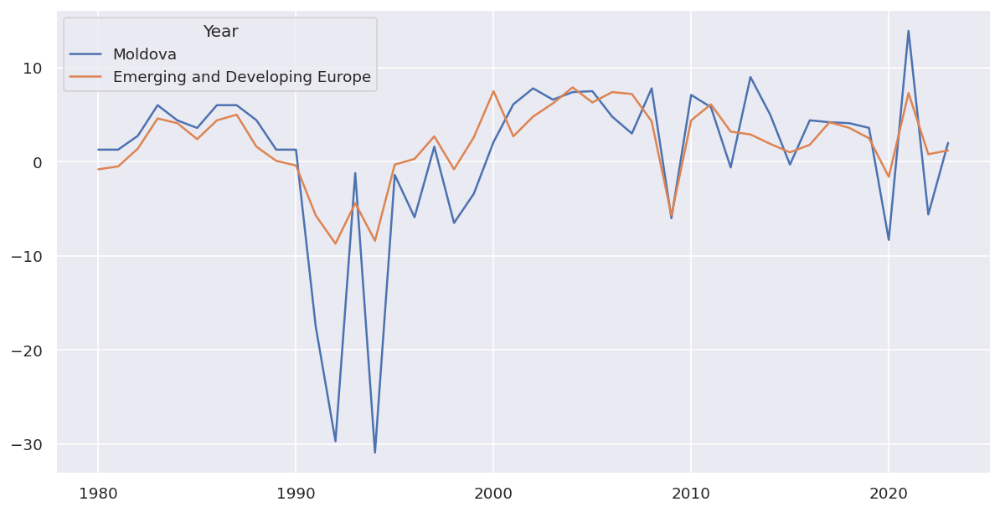

In [50]:
df[["Moldova", "Emerging and Developing Europe"]].plot()

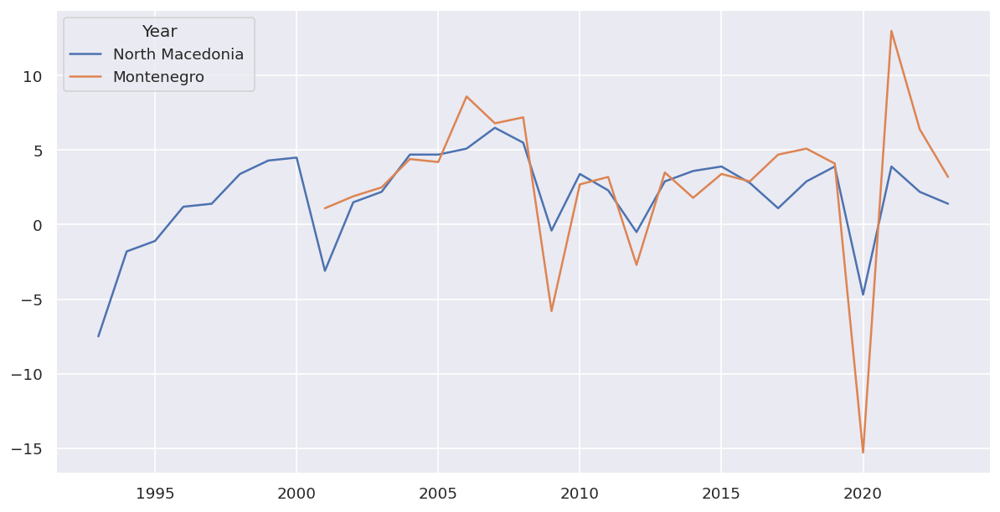

In [51]:
df[["North Macedonia ", "Montenegro"]].plot()

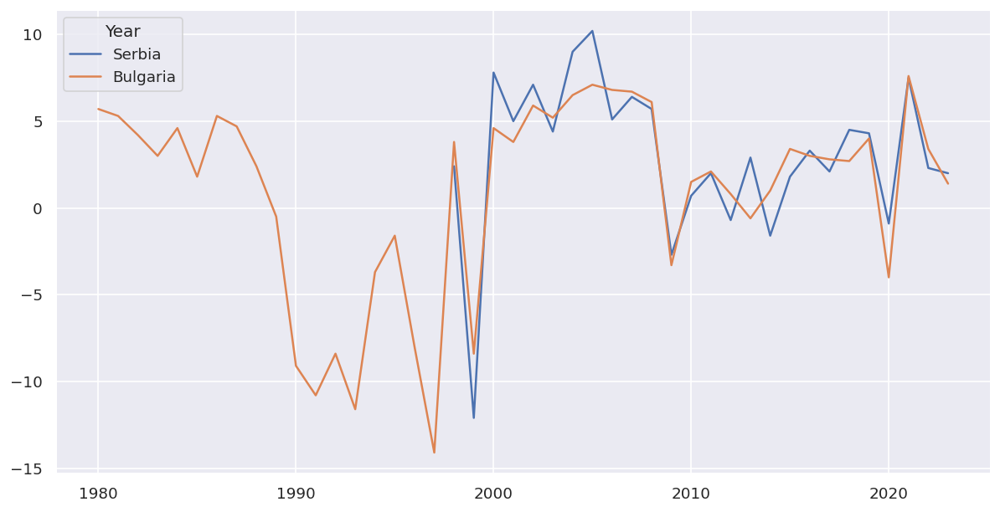

In [52]:
df[["Serbia", "Bulgaria"]].plot()

- Apesar de alguns vales, ainda sim os países apresentam um comportamento similar, justuficando a alt correlação entre ambos.

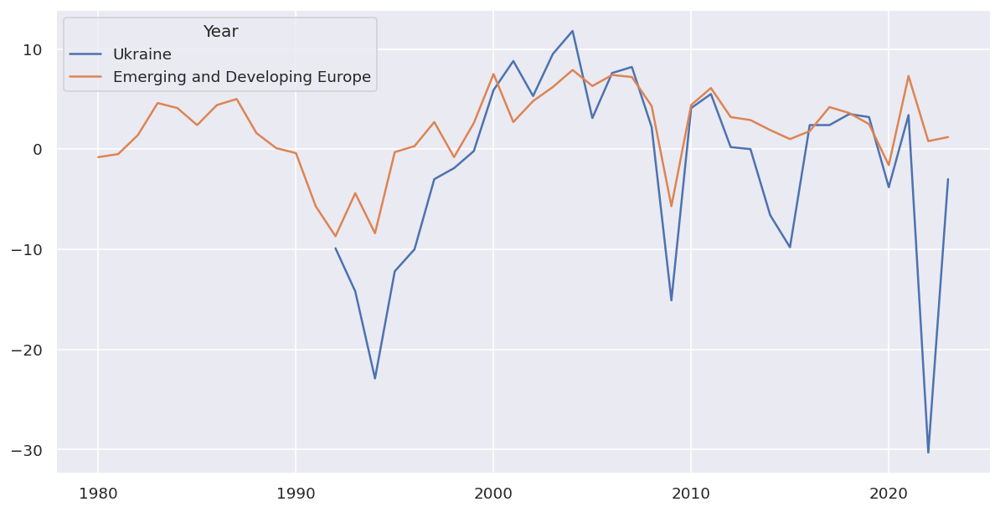

In [53]:
df[["Ukraine", "Emerging and Developing Europe"]].plot()

- Assim como o país de Moldova, a Ucrânia apresenta uma correlação com GDP do seu grupo e alguns valores fora da curva, como nos anos de 2022, 1994 e a crise de 2009, serão tratados de maneira particular

In [54]:
df = fill_missing_values_model(df, 
                          ["Ukraine", "Emerging and Developing Europe"], 
                          "Emerging and Developing Europe", 
                          [1994, 2009, 2022])

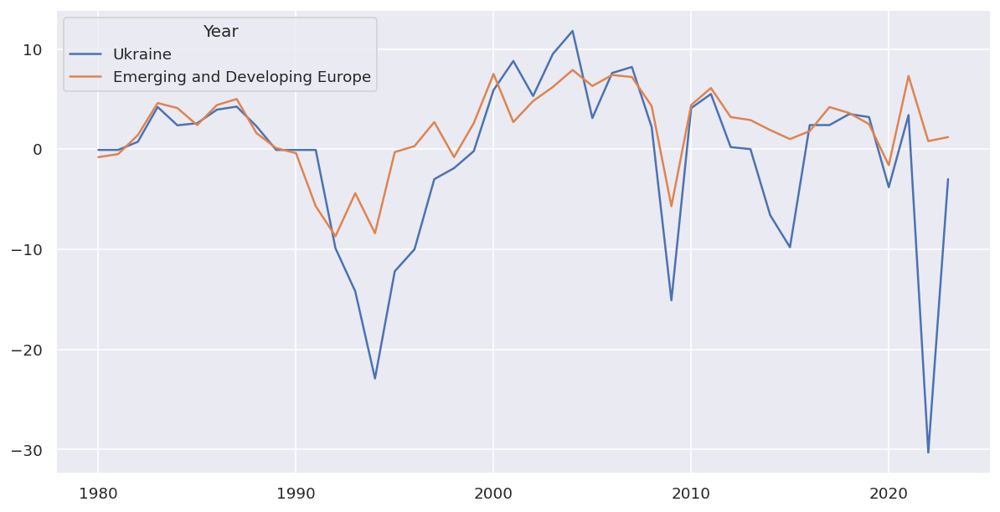

In [55]:
df[["Ukraine", "Emerging and Developing Europe"]].plot()

- Para os demais países, é válido o preenchimento com modelo se as condições forem atendidas, ou com a média do grupo

In [56]:
df = fill_missing_values_model(df, 
                          analytical_group["Emerging and Developing Europe"], 
                          "Emerging and Developing Europe", 
                          [2009, 2020])

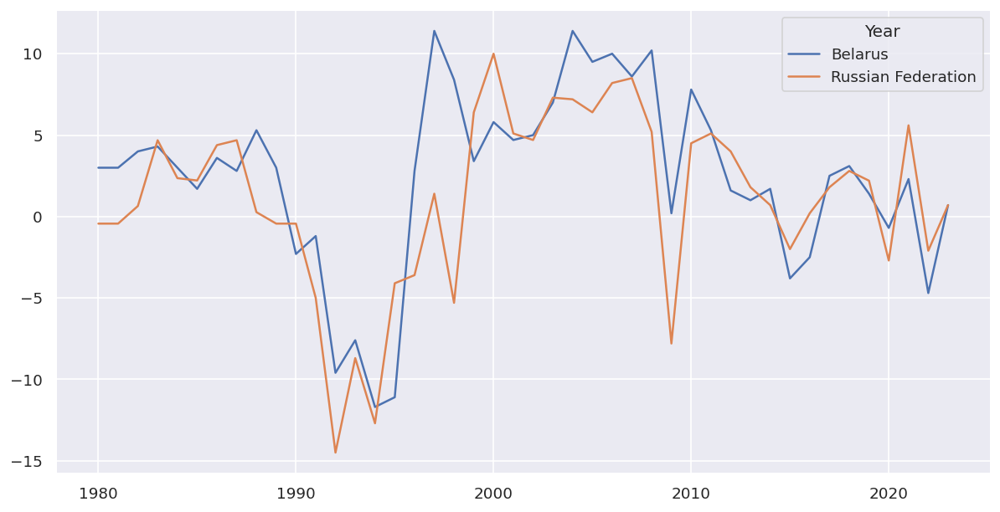

In [57]:
df[["Belarus", "Russian Federation"]].plot()

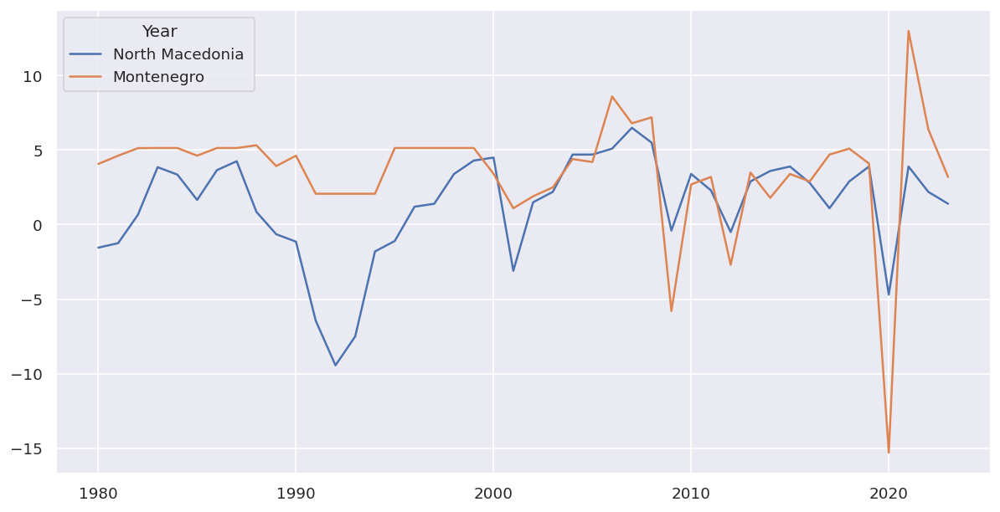

In [58]:
df[["North Macedonia ", "Montenegro"]].plot()

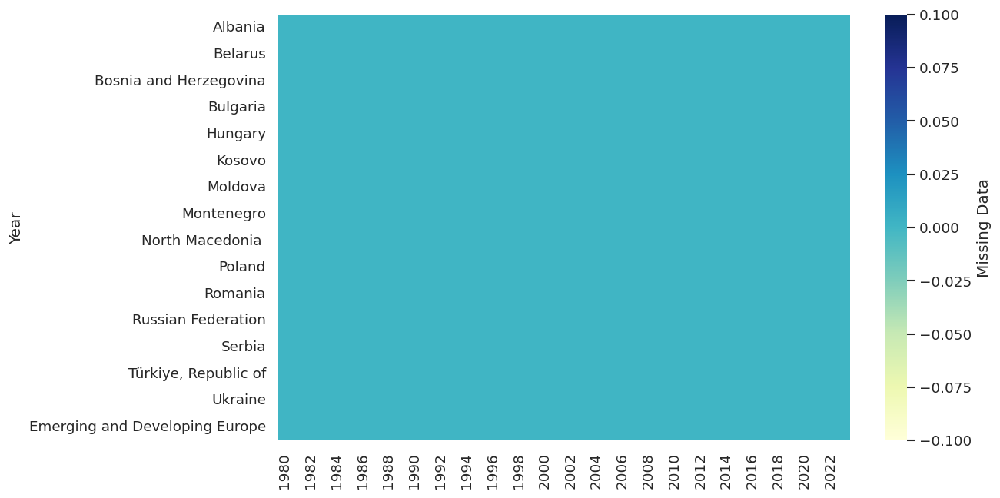

In [59]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["Emerging and Developing Europe"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})

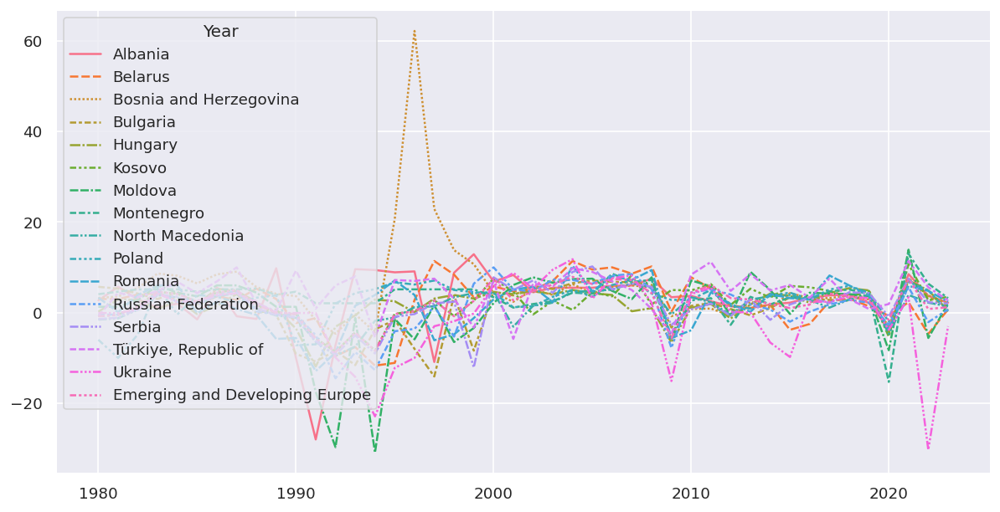

In [60]:
sns.lineplot(df[analytical_group["Emerging and Developing Europe"]]).plot()
plt.show()

#### European Union

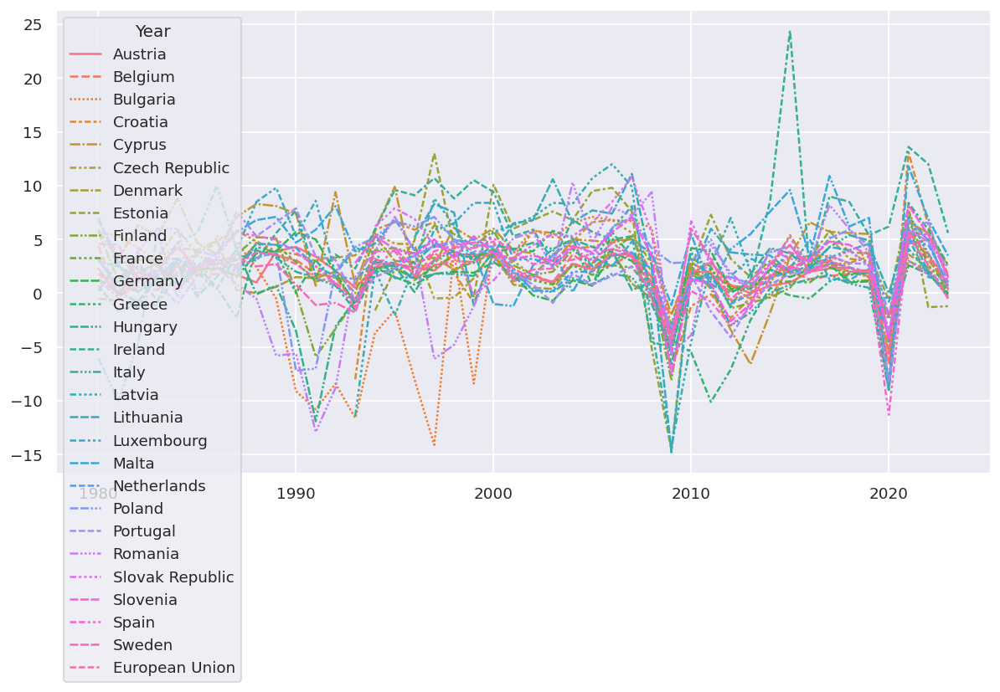

In [61]:
sns.lineplot(df[analytical_group["European Union"]]).plot()
plt.show()

- Como já mencionando, podemos observar dois grandes vales em comum para todos os países, no ano de 2009 e 2020

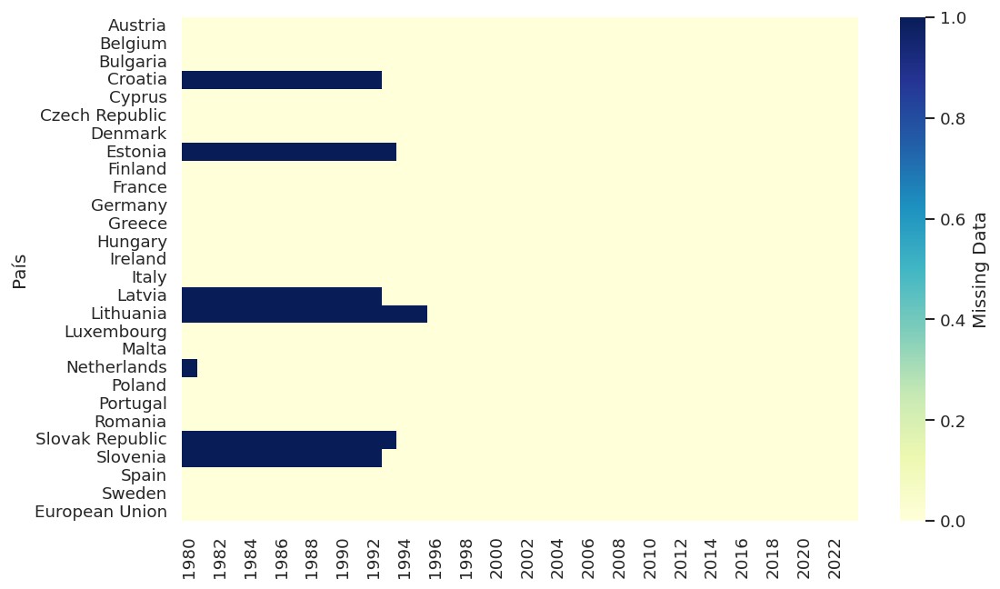

In [62]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["European Union"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.ylabel("País")

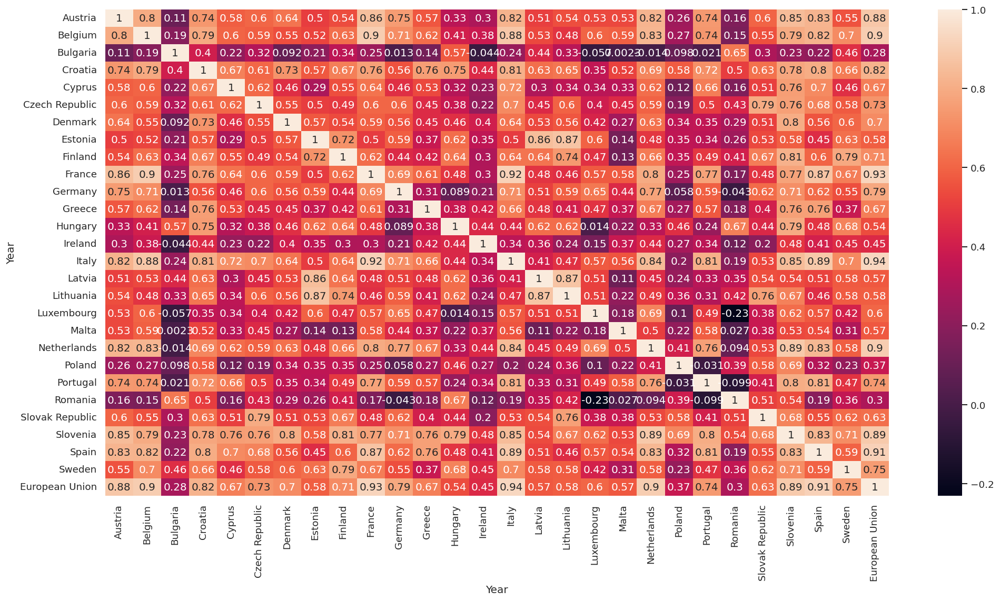

In [63]:
plt.figure(figsize=(20,10))
sns.heatmap(df[analytical_group["European Union"] ].corr(), annot=True)
plt.show()

- Croácia tem uma alta correlação com a união europeia

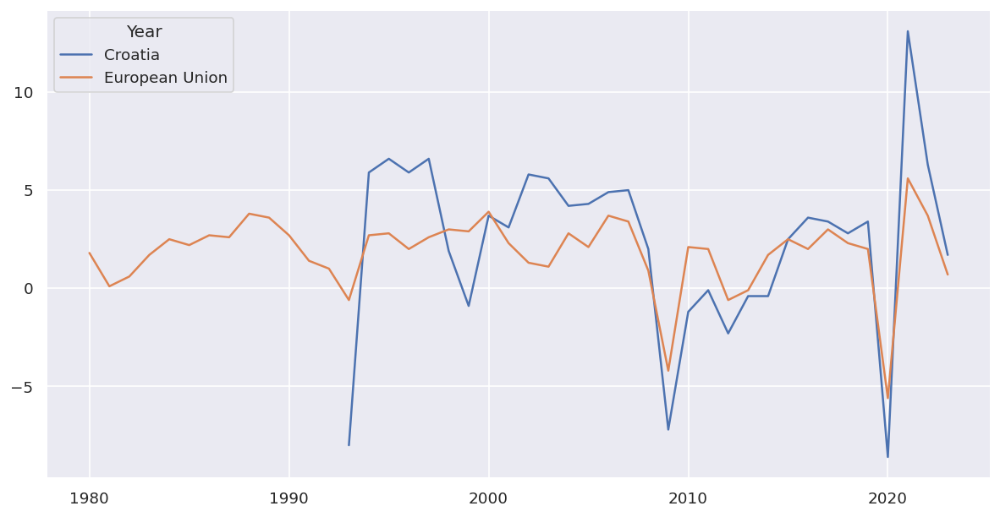

In [64]:
df[["Croatia", "European Union"]].plot()

- Para a imputação dos dados da croácia, podemos remover, além do ano de crise e pandemia, seu primeiro dado de amostra do ano de 1993

In [65]:
df = fill_missing_values_model(df, 
                          ["Croatia", "European Union"], 
                          "European Union", 
                          [1993, 2009, 2020])

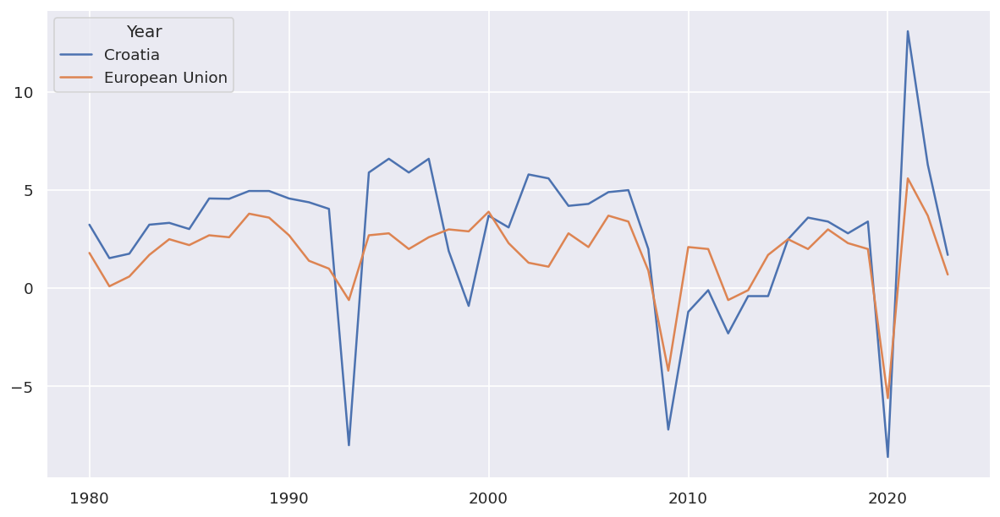

In [66]:
df[["Croatia", "European Union"]].plot()

- Estônia e Lituânia

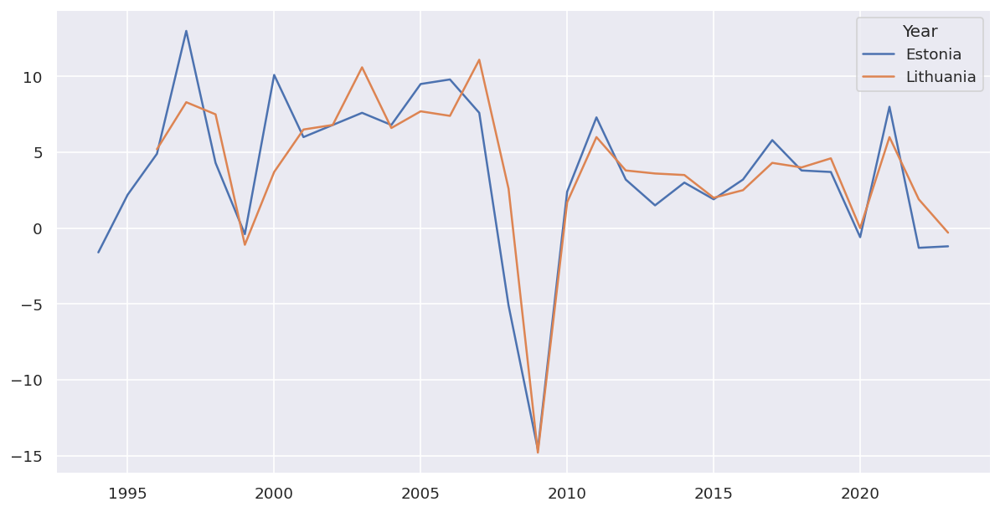

In [67]:
df[["Estonia", "Lithuania"]].plot()

- Os países possuem uma forte correlação, além de ambos serem originários da antiga União Soviética, o que pode explicar tal similaridade de dados.

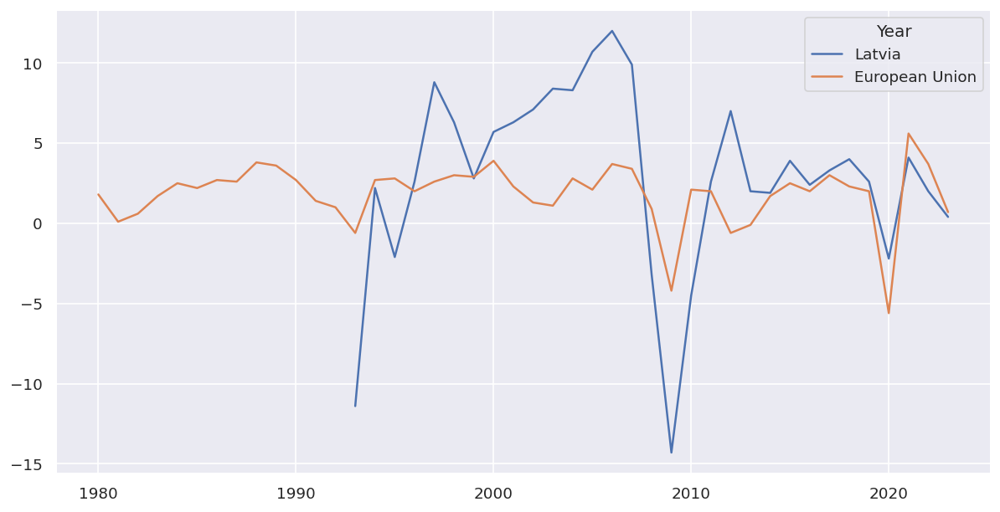

In [68]:
df[["Latvia", "European Union"]].plot()

- O país de Latvia também é fortemente afetado no ano da crise de 2009, além do seu primeiro ano de observação, em 1993 sendo válido o preenchimento individual, retirando tais dados da série

In [69]:
df = fill_missing_values_model(df, 
                          ["Latvia", "European Union"], 
                          "European Union", 
                          [1993, 2009, 2020])

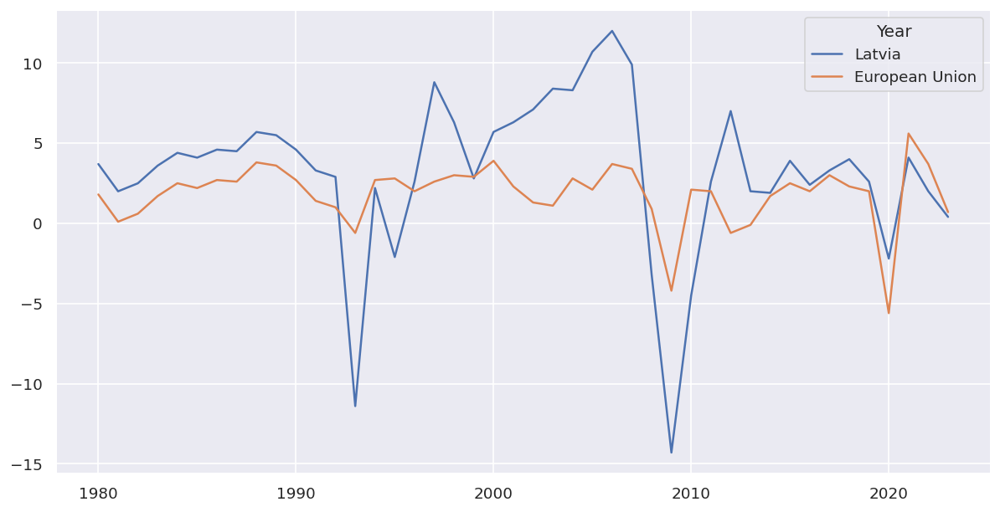

In [70]:
df[["Latvia", "European Union"]].plot()

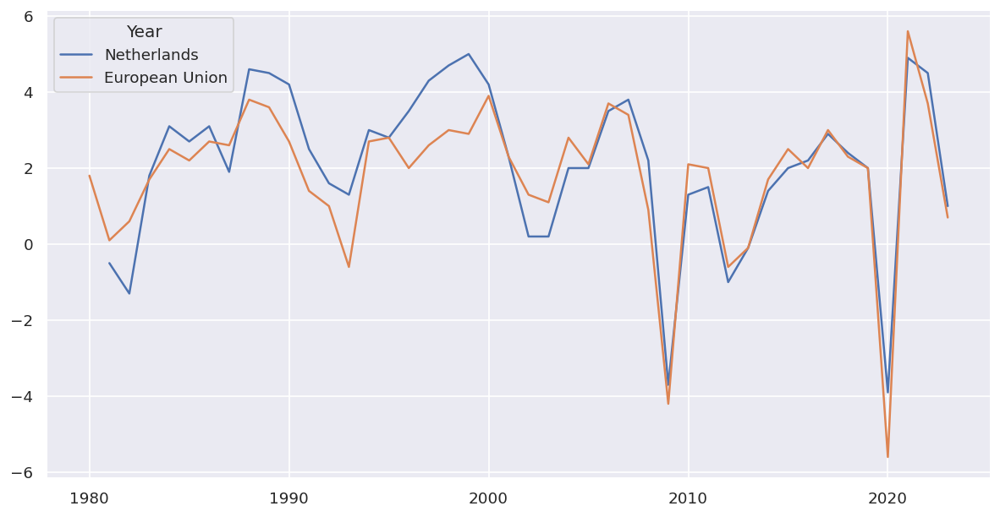

In [71]:
df[["Netherlands", "European Union"]].plot()

- GDP da Holanda é fortemente ligado com o do grupo da união Europeia como um todo, com poucos dados faltantes

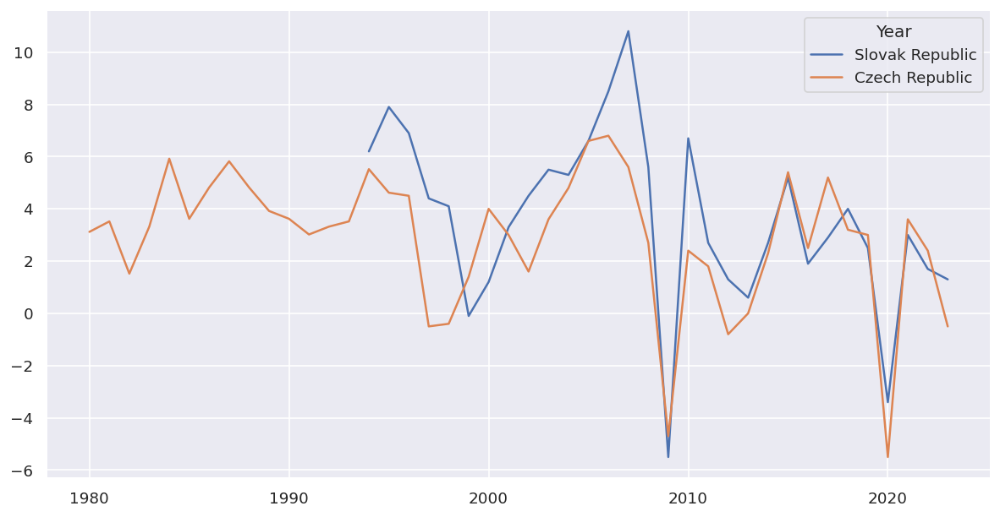

In [72]:
df[["Slovak Republic", "Czech Republic"]].plot()

- Aqui, temos tamanha similaridade devido a originariedade de ambos os países serem gerados a partir da dissolvição da antida Checoslováquia em 1993, dessa maneira, temos comportamentos econômicos bastante similares.

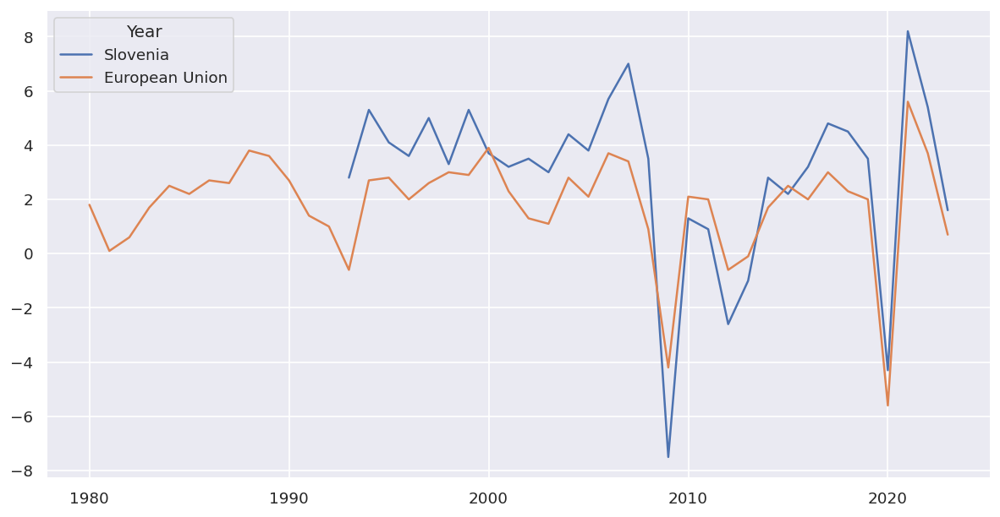

In [73]:
df[["Slovenia", "European Union"]].plot()

- Comportamentos similares com o grupo, novamente deve ser dropado dos dados os anos atípicos da pandemia e crise mundial.

In [74]:
df = fill_missing_values_model(df, 
                          analytical_group["European Union"], 
                          "European Union", 
                          [2009, 2020])

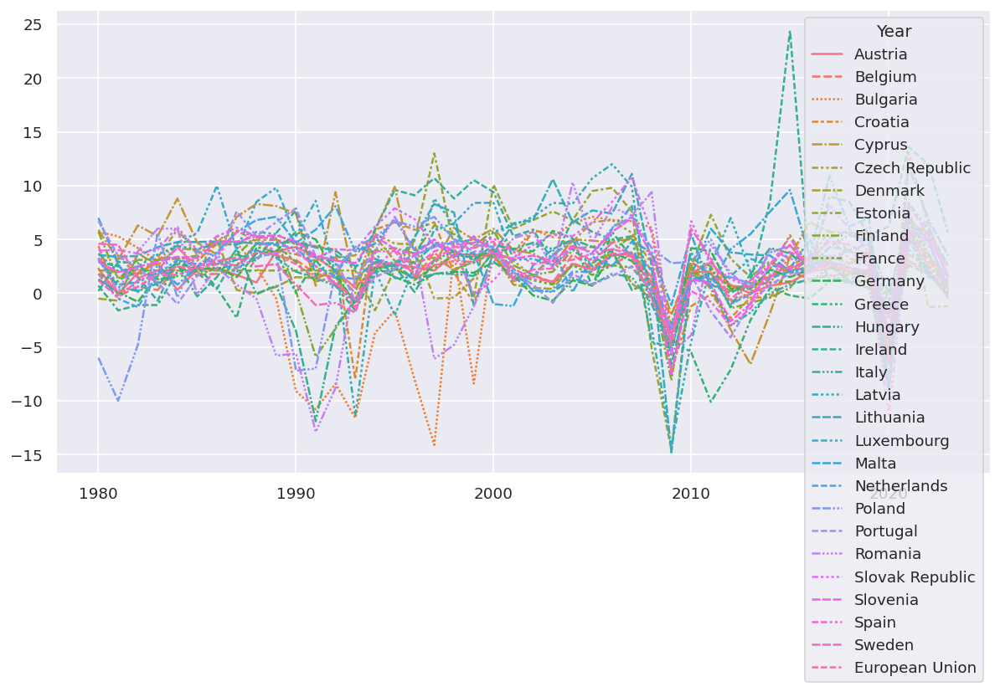

In [75]:
sns.lineplot(df[analytical_group["European Union"]]).plot()
plt.show()

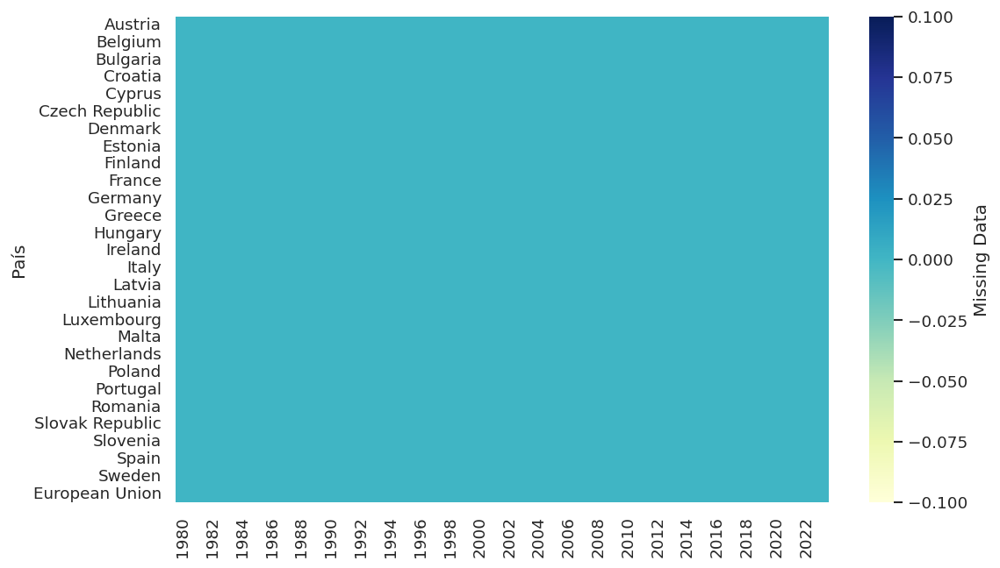

In [76]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["European Union"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.ylabel("País")

#### Emerging and Developing Asia

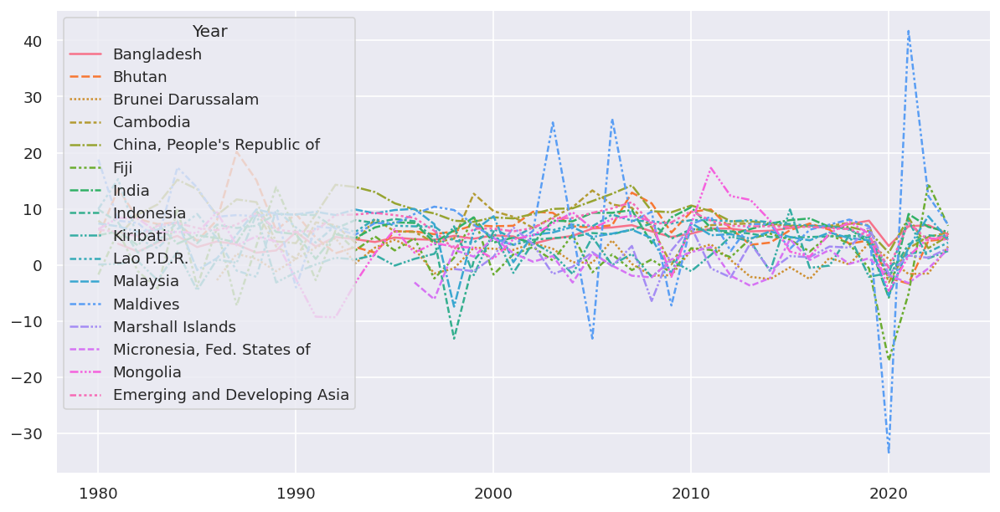

In [77]:
sns.lineplot(df[analytical_group["Emerging and Developing Asia"]]).plot()
plt.show()

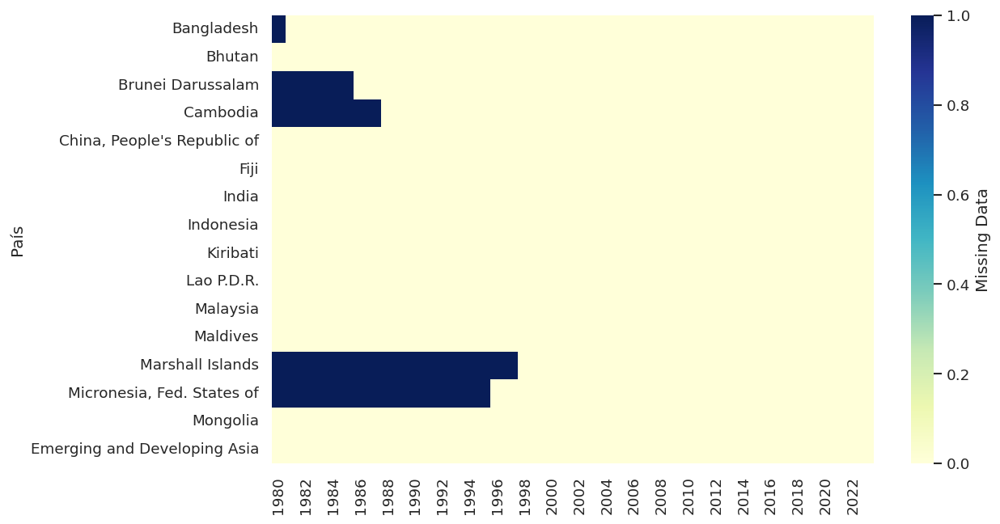

In [78]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["Emerging and Developing Asia"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.ylabel("País")

- Nos países em desenvolvimento na ásia, podemos notar um vale em comum em 2020, porém os países parecem pouco afetados na crise 2009. Além disso, neste grupo existem apenas 5 países com valores faltantes.

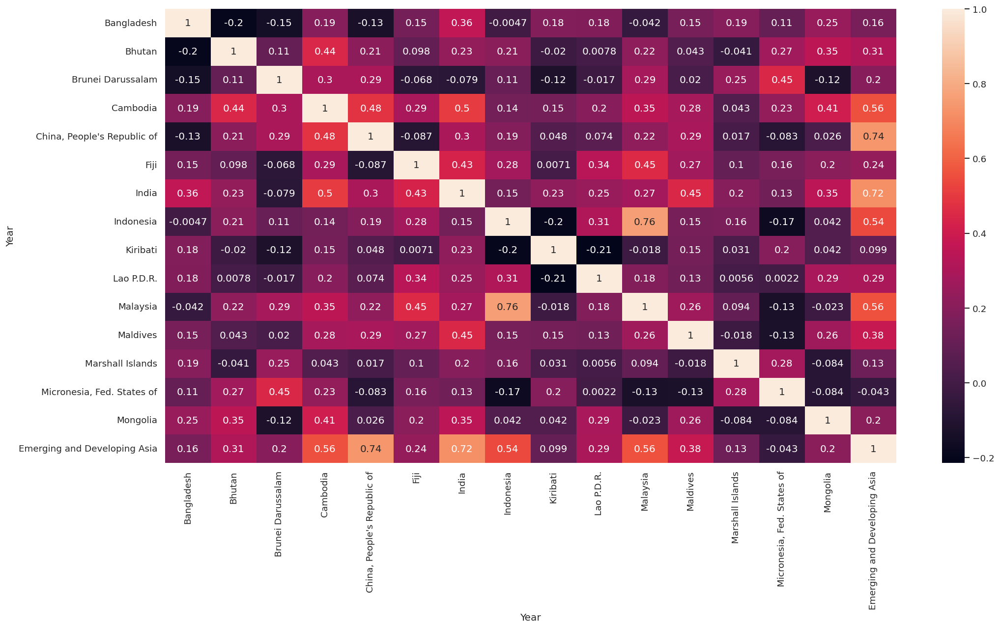

In [79]:
plt.figure(figsize=(20,10))
sns.heatmap(df[analytical_group["Emerging and Developing Asia"] ].corr(), annot=True)
plt.show()

- Dentro dos países do grupo, existe uma baixa correlação entre si com algumas raras excções em relação ao GDP geral do grupo. Assim, todos serão preenchidos diretamente com a média do grupo, não havendo possibilidade da utilização de um modelo com base em correlações.

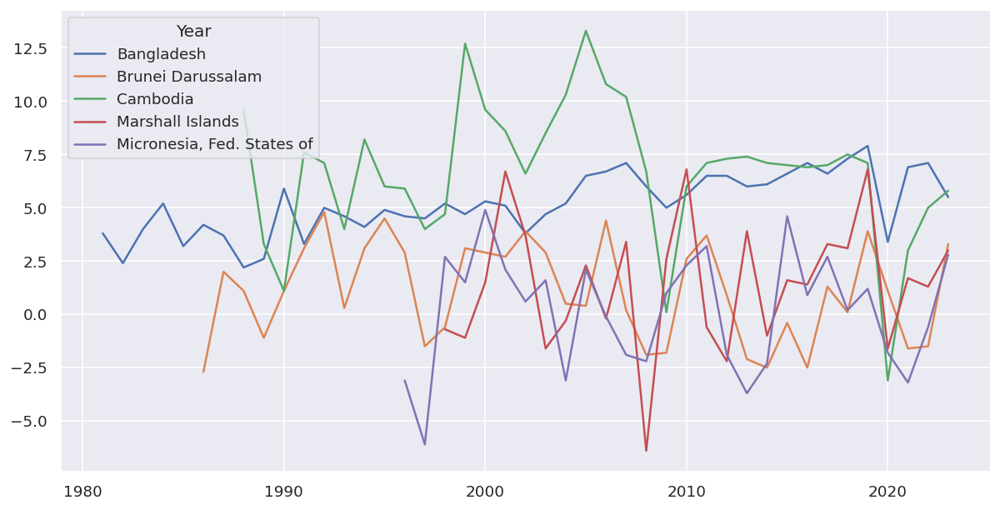

In [80]:
df[["Bangladesh", "Brunei Darussalam", "Cambodia", "Marshall Islands", "Micronesia, Fed. States of"]].plot()

- Para o país de Bangladesh o GDP evolui sem muitos ruídos, apeans para o ano de 2020
- Em Brunei o gráfico de GDP é sofre bastante com diversos picos e vales, os anos de pandemia e crise mundial não saem do pdrão para este país.
- Para o país de Cambodia temos uma grande queda na pandemia, o que também vale ser preenchido individualmente.
- O país de Masrshall segue o mesmo padrão de Brunei, com grandes oscilações, porém com uma grande queda em 2009.
- Para Micronésia, existem poucos dados e também com grandes oscilações

In [81]:
df = fill_missing_values_group_mean(df, "Bangladesh", "Emerging and Developing Asia", [2020])

In [82]:
df = fill_missing_values_group_mean(df, "Cambodia", "Emerging and Developing Asia", [2020])

In [83]:
df = fill_missing_values_group_mean(df, "Marshall Islands", "Emerging and Developing Asia", [2009])

In [84]:
df = fill_missing_values_model(df, 
                          analytical_group["Emerging and Developing Asia"], 
                          "Emerging and Developing Asia", 
                          [])

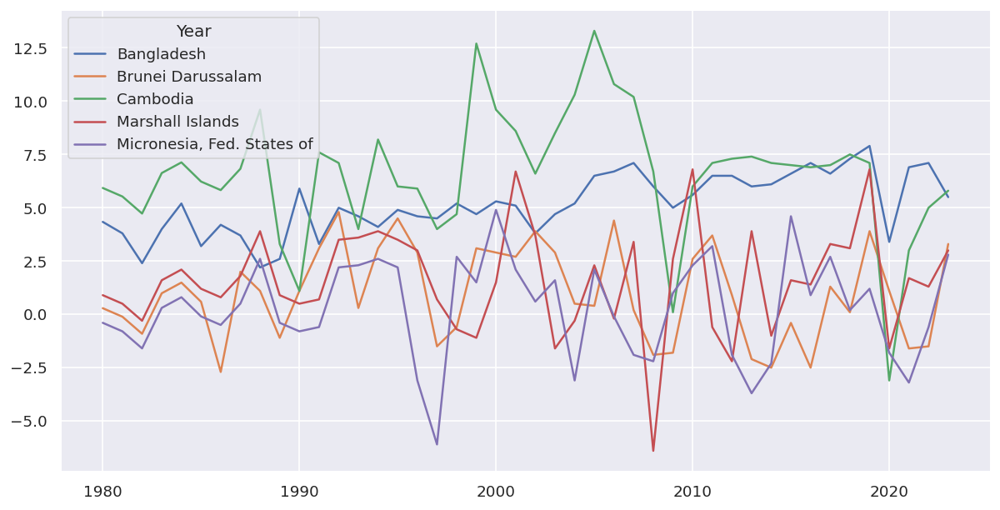

In [85]:
df[["Bangladesh", "Brunei Darussalam", "Cambodia", "Marshall Islands", "Micronesia, Fed. States of"]].plot()

#### Latin America and the Caribbean

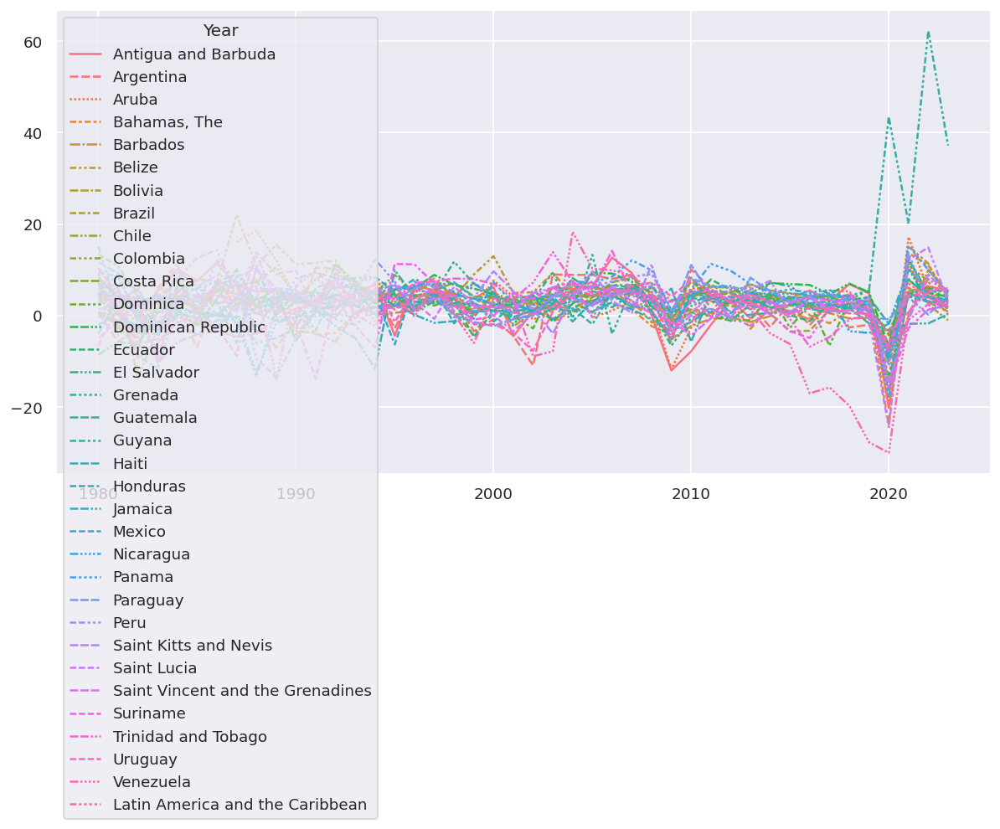

In [86]:
sns.lineplot(df[analytical_group["Latin America and the Caribbean"]]).plot()
plt.show()

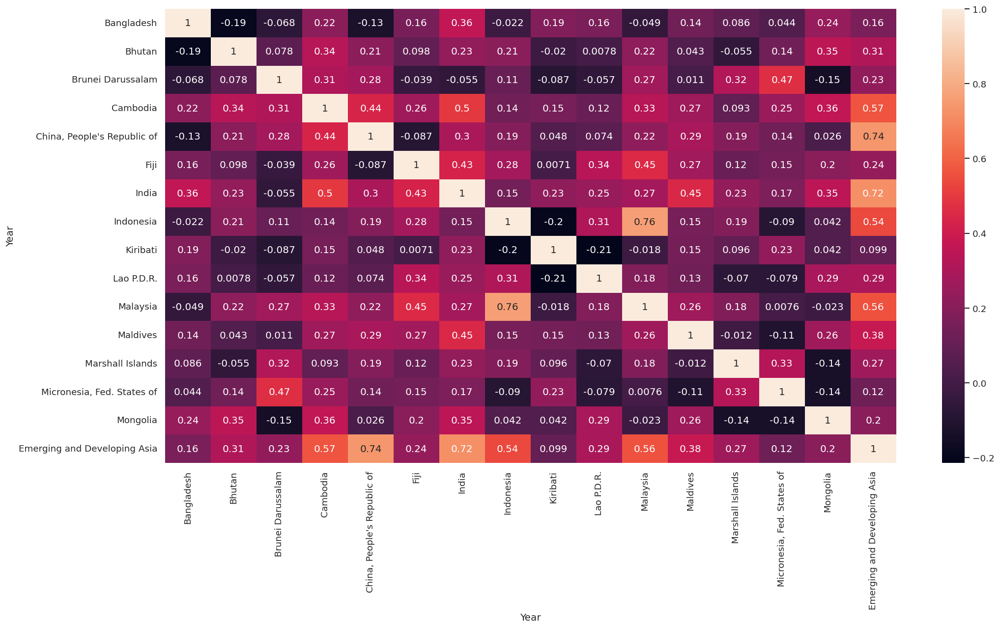

In [87]:
plt.figure(figsize=(20,10))
sns.heatmap(df[analytical_group["Emerging and Developing Asia"] ].corr(), annot=True)
plt.show()

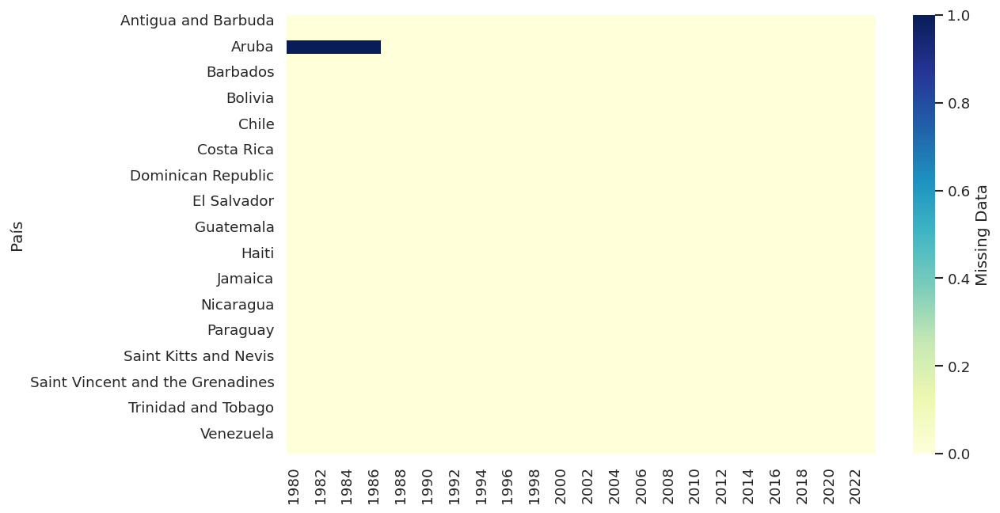

In [88]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["Latin America and the Caribbean"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.ylabel("País")

- Apesar da pouca correlação entre os países do grupo, além de grandes oscilações para os países de Guyana e Venezuela, existem valores faltantes apenas para o país de Aruaba

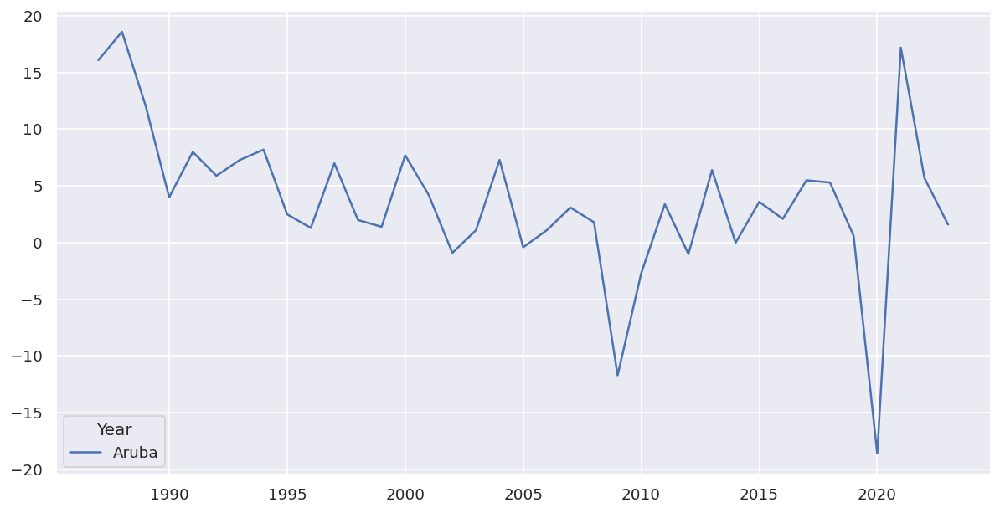

In [89]:
df[["Aruba"]].plot()

- Para o país de Aruba, podemos realizar o preenchimento dos dados desconsiderando os anos de 2020, 2009 e 1988

In [90]:
df = fill_missing_values_model(df, 
                          analytical_group["Latin America and the Caribbean"], 
                          "Latin America and the Caribbean", 
                          [1988, 2009, 2020])

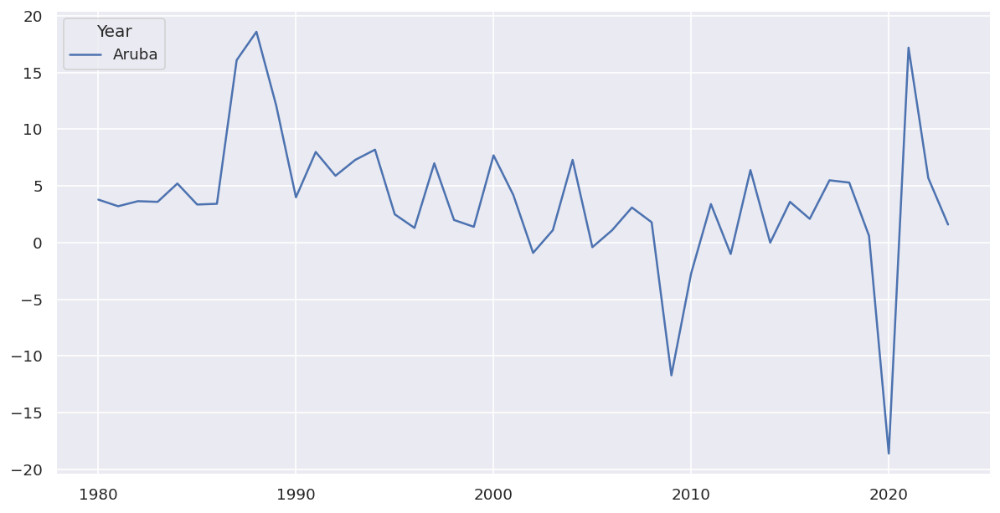

In [91]:
df[["Aruba"]].plot()

#### Middle East and Central Asia

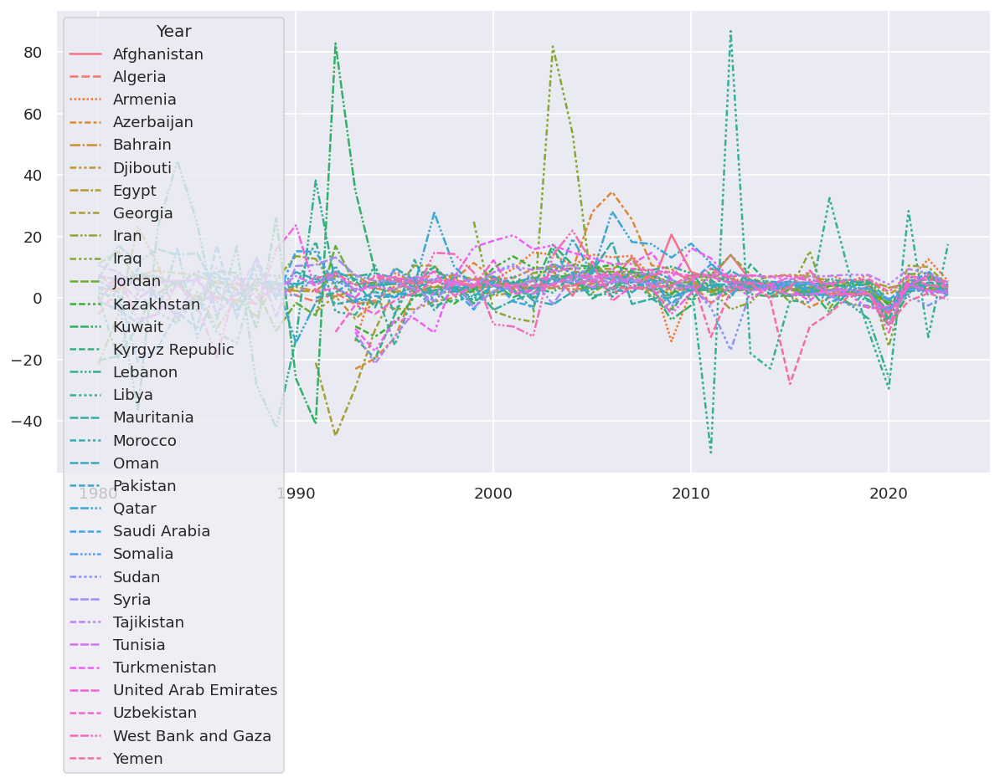

In [92]:
sns.lineplot(df[analytical_group["Middle East and Central Asia"]]).plot()
plt.show()

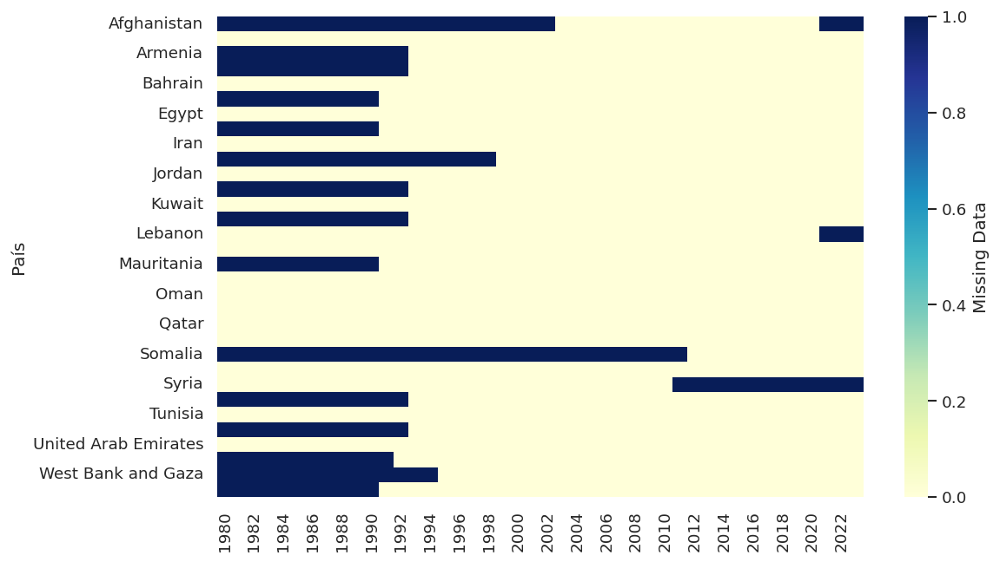

In [93]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["Middle East and Central Asia"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.ylabel("País")

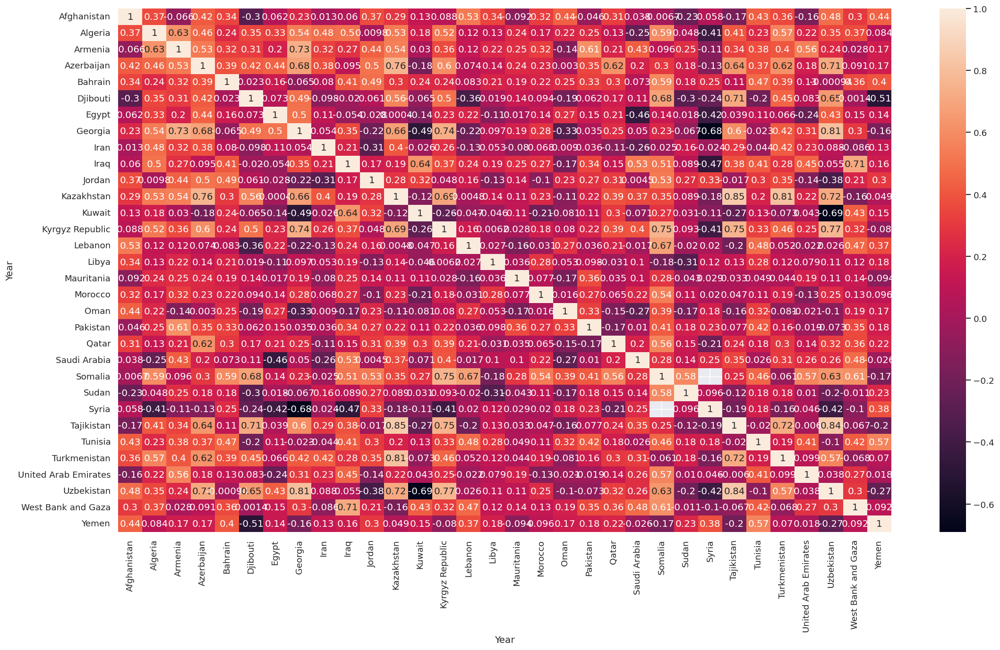

In [94]:
plt.figure(figsize=(22,12))
sns.heatmap(df[analytical_group["Middle East and Central Asia"] ].corr(), annot=True)
plt.show()

In [96]:
columns_with_missing = df[analytical_group["Middle East and Central Asia"]].columns[df[analytical_group["Middle East and Central Asia"]].isnull().any()]

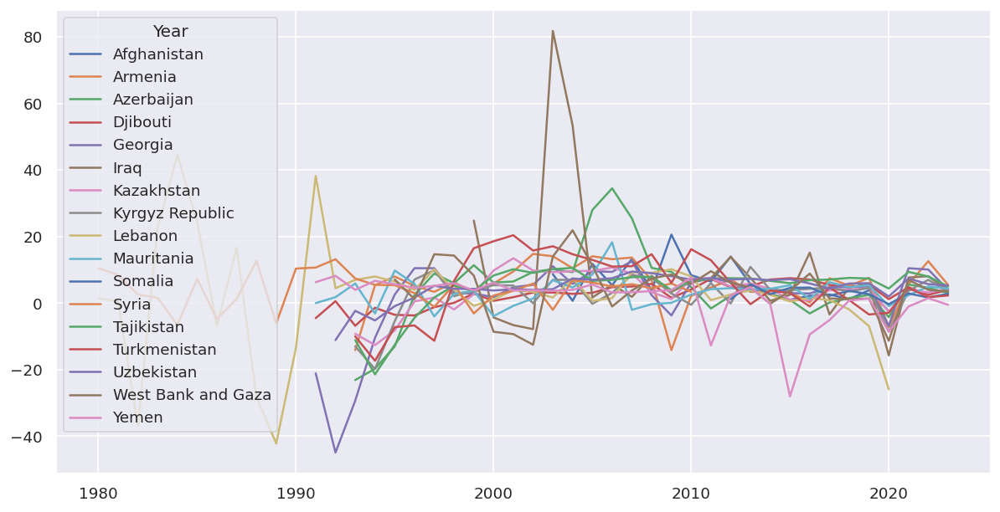

In [97]:
df[columns_with_missing].plot()

- Em um âmbito geral, dentro dos paísos com valores faltantes, notamos um impacto geral no ano de 2020. No entando, existem discrpâncias de valores, especialmente para o Iraque, que pode ser tratado indivualmente

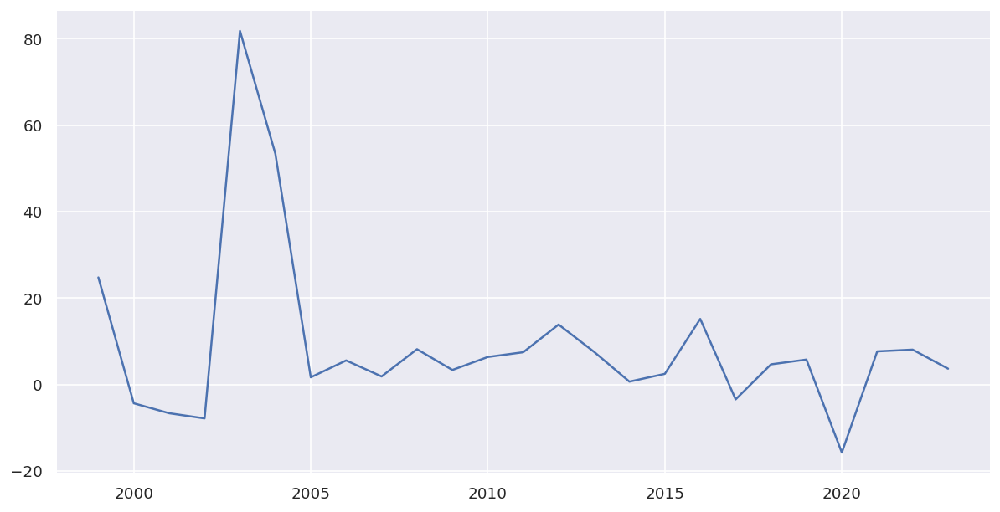

In [98]:
df["Iraq"].plot()

In [99]:
df = fill_missing_values_group_mean(df, 
                          "Iraq", 
                          "Middle East and Central Asia", 
                          [2003, 2004, 2020])

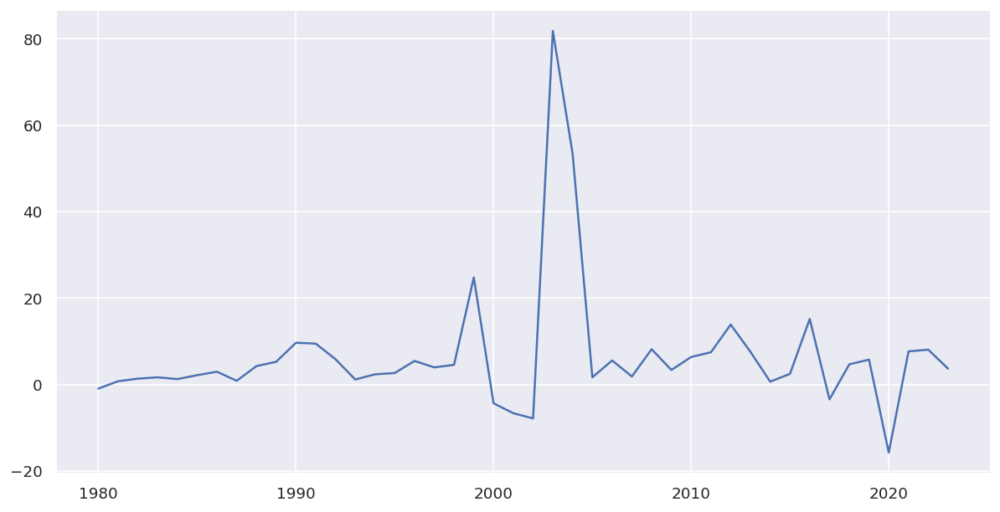

In [100]:
df["Iraq"].plot()

In [101]:
df = fill_missing_values_model(df, 
                          analytical_group["Middle East and Central Asia"], 
                          "Middle East and Central Asia", 
                          [2020])

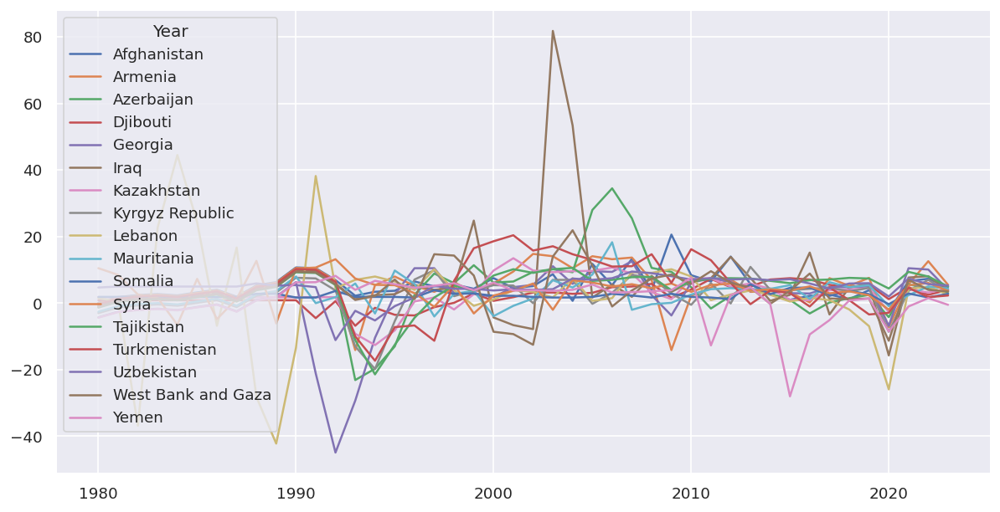

In [102]:
df[columns_with_missing].plot()

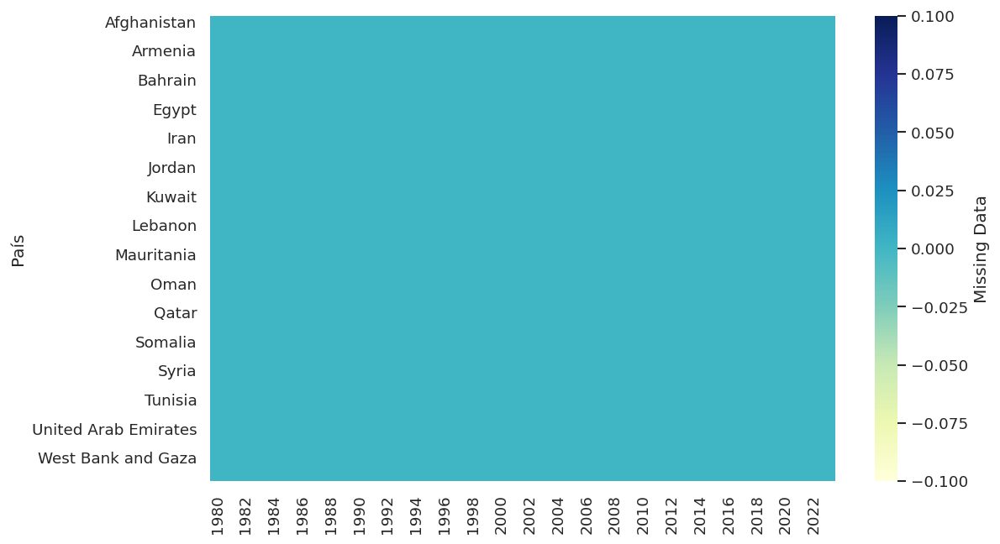

In [103]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["Middle East and Central Asia"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.ylabel("País")

#### Sub-Saharan Africa

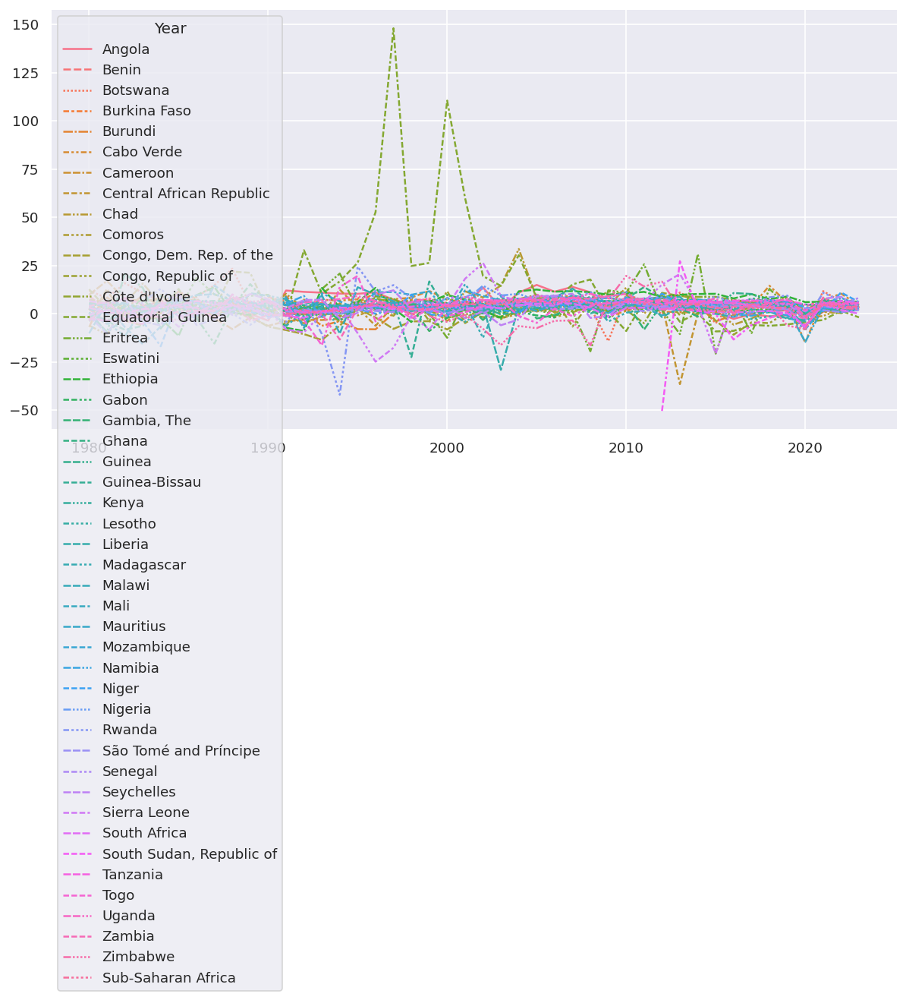

In [104]:
sns.lineplot(df[analytical_group["Sub-Saharan Africa"]]).plot()
plt.show()

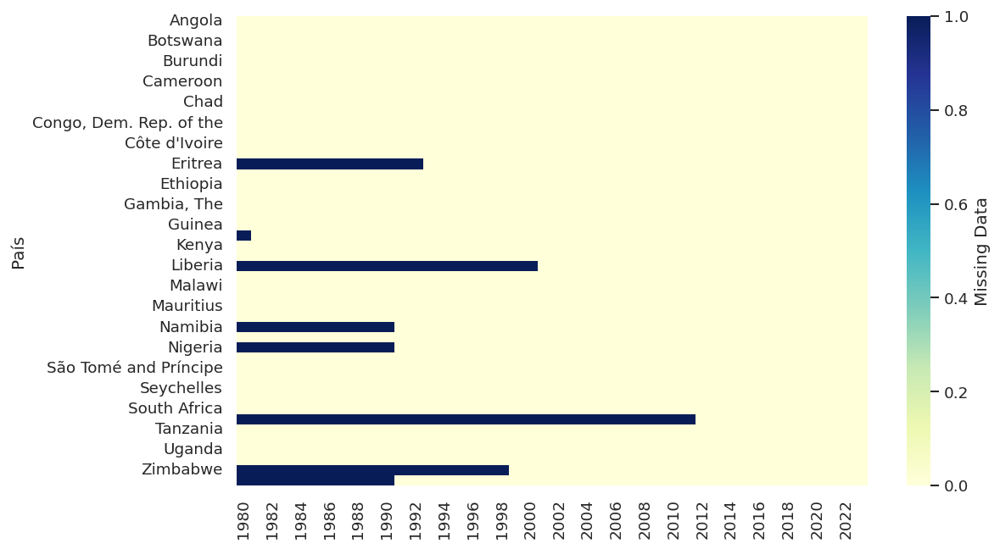

In [105]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["Sub-Saharan Africa"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.ylabel("País")

- Dentro do grupo de África sub-saariana existem poucos países com valores faltamtes, no entanto, já é possível observar curvas de GDP bastante fora dos padrões do grupo, oqeu será investigado se pertencem grupo com valores faltantes.

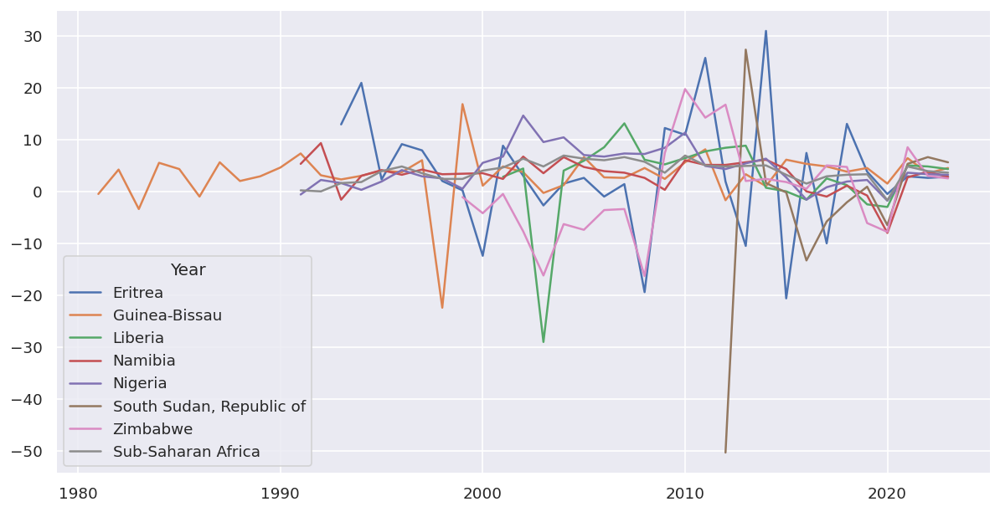

In [106]:
columns_with_missing = df[analytical_group["Sub-Saharan Africa"]].columns[df[analytical_group["Sub-Saharan Africa"]].isnull().any()]
df[columns_with_missing].plot()

- Os países com valores faltantes apresentam  comportamentos similares, com bastante oscilações inerentes a sua economia, com pontos de atenção para Sudão do sul e Libéria, que podem ser preenchidos indivualmente retirnando-se seus valores discrepantes.

- Válido observar também que, existem valores faltantes no próprio índice de GDP do grupo, que de acordo como foi definido, será preenchido com o valor da mediana

In [107]:
df = fill_missing_values_group_mean(df, 
                          "Sub-Saharan Africa", 
                          "Sub-Saharan Africa", 
                            [])

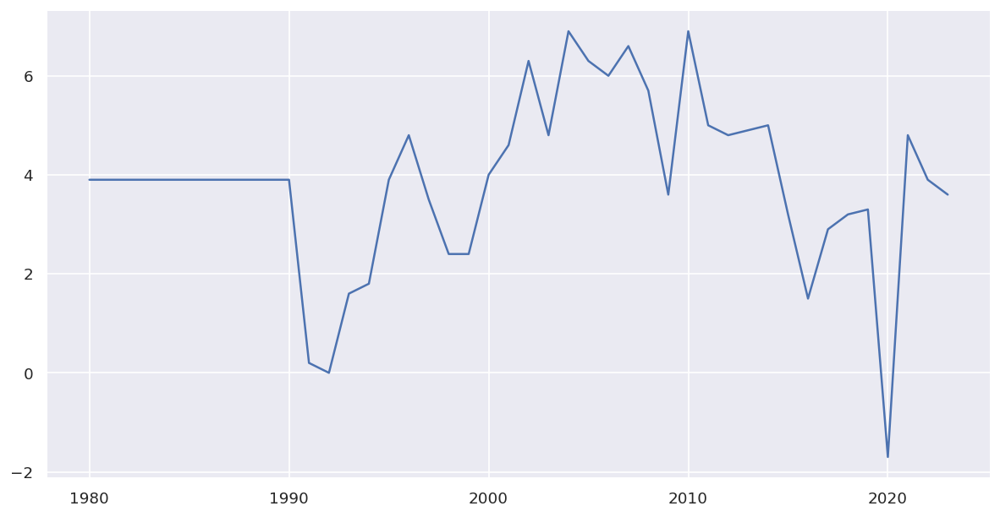

In [108]:
df["Sub-Saharan Africa"].plot()

In [109]:
df = fill_missing_values_group_mean(df, 
                          "South Sudan, Republic of", 
                          "Sub-Saharan Africa", 
                            [2012, 2020])

In [110]:
df = fill_missing_values_group_mean(df, 
                          "Liberia", 
                          "Sub-Saharan Africa", 
                            [2003, 2020])

In [111]:
df = fill_missing_values_model(df, 
                          analytical_group["Sub-Saharan Africa"], 
                          "Sub-Saharan Africa", 
                          [2020])

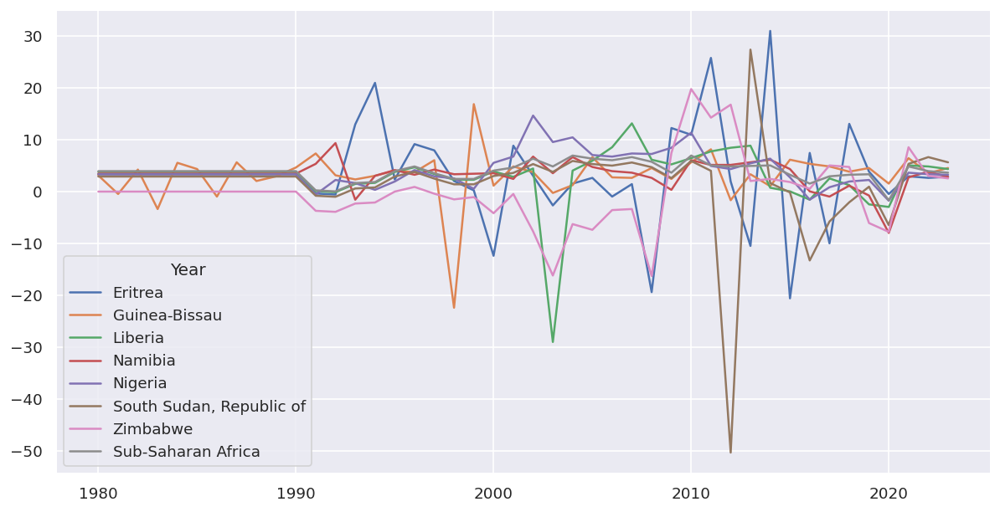

In [112]:
df[columns_with_missing].plot()

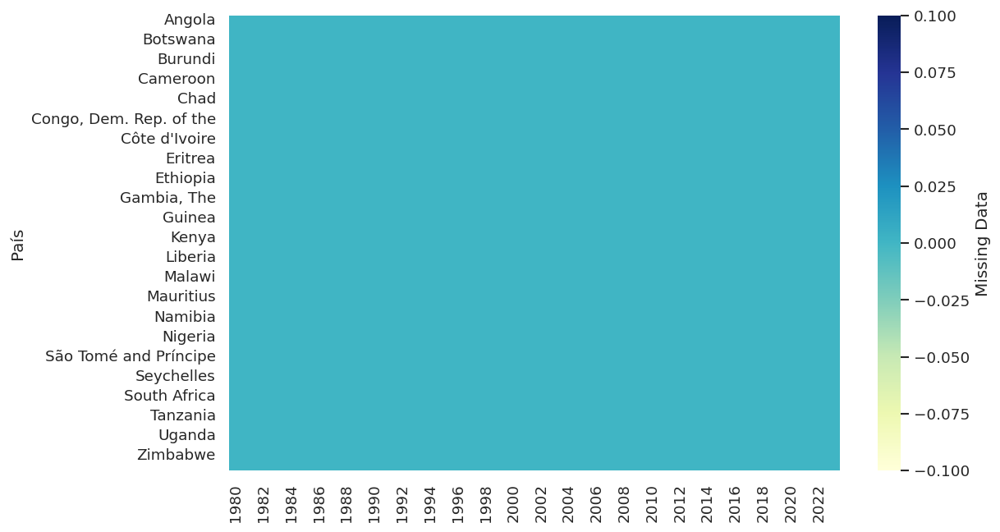

In [113]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["Sub-Saharan Africa"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.ylabel("País")

#### Emerging market and developing economies

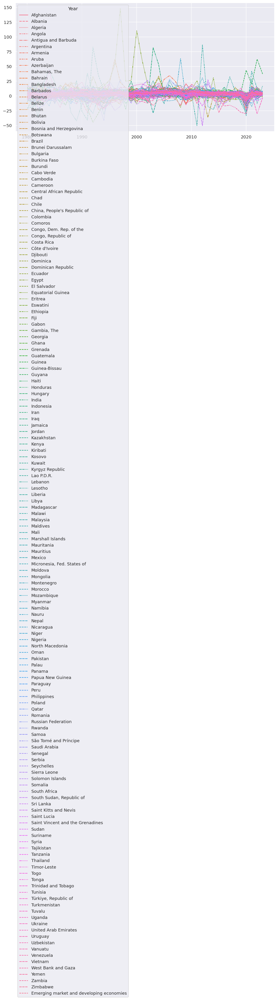

In [114]:
sns.lineplot(df[analytical_group["Emerging market and developing economies"]]).plot()
plt.show()

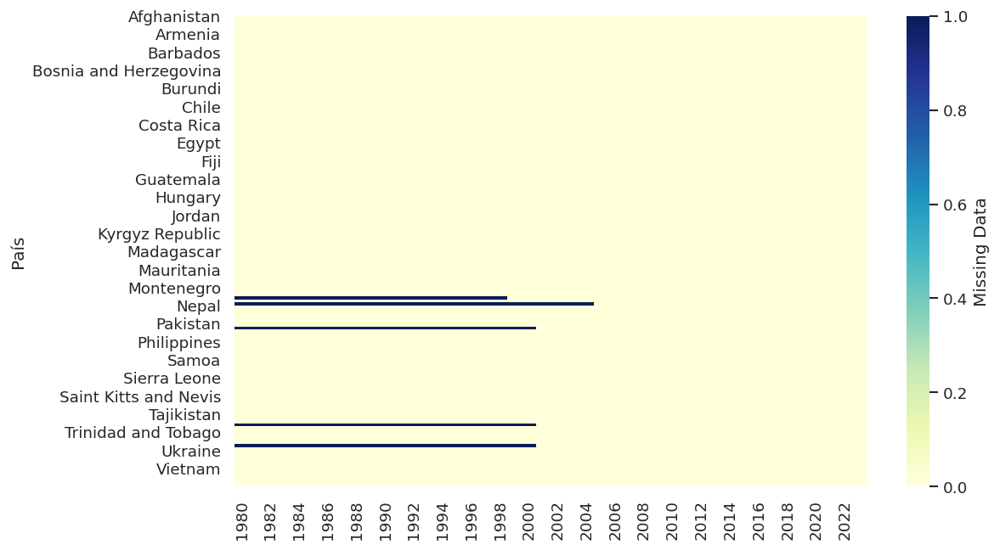

In [115]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df[analytical_group["Emerging market and developing economies"]].isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.ylabel("País")

- Aqui, vamos observar os países com valores faltantes

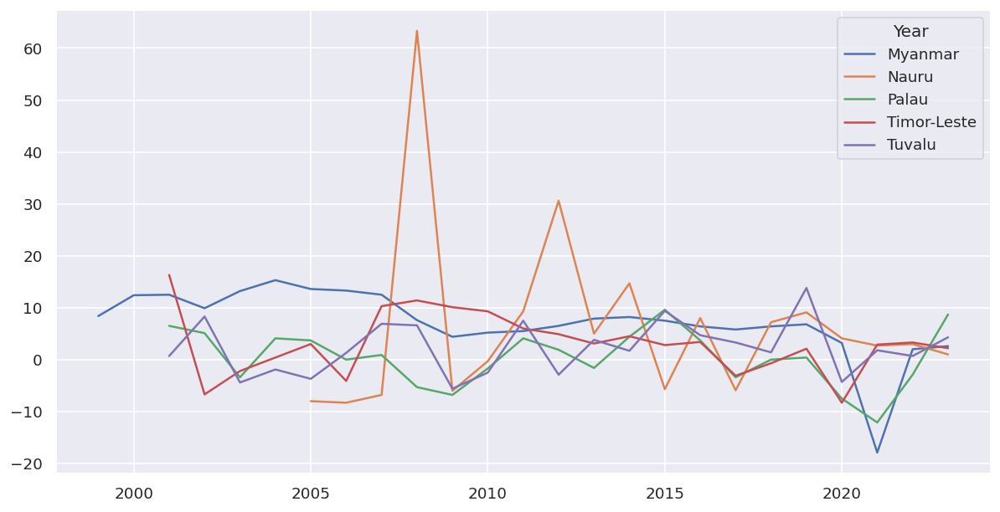

In [116]:
columns_with_missing = df[analytical_group["Emerging market and developing economies"]].columns[df[analytical_group["Emerging market and developing economies"]].isnull().any()]
df[columns_with_missing].plot()

- Os dados para o grupo de países com valores faltantes são bastante recentes. Como destaque, podemos observar que para o país de Nauru há uma grande pico no ano de 2012, que pode ser tratado individualmente. Além disso, os países não demonstra, serem atingidos pela pandemia, nem na crise de 2009.

In [117]:
df = fill_missing_values_group_mean(df, 
                          "Nauru", 
                          "Emerging market and developing economies", 
                            [2012])

In [118]:
df = fill_missing_values_model(df, 
                          analytical_group["Emerging market and developing economies"], 
                          "Emerging market and developing economies", 
                          [])

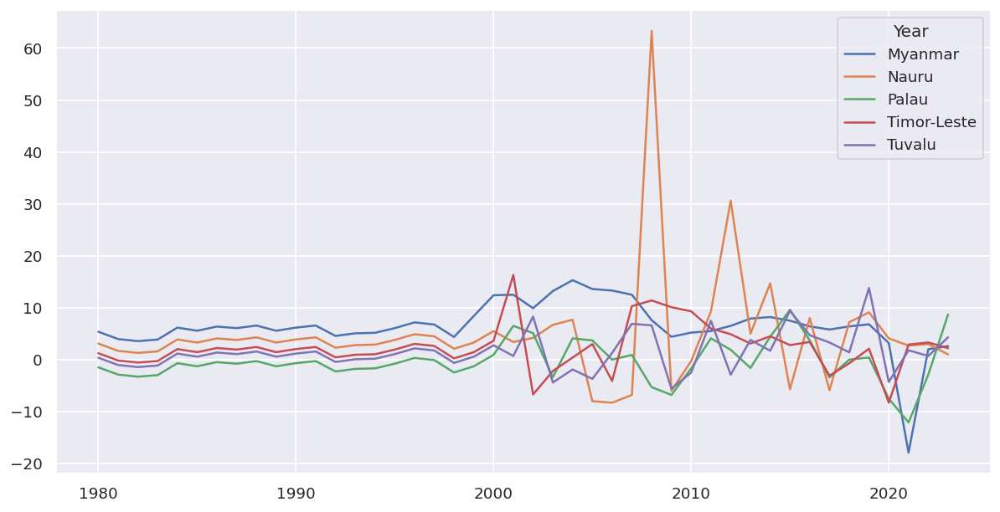

In [119]:
df[columns_with_missing].plot()

### Checagem se todos os valores faltantes foram preenchidos

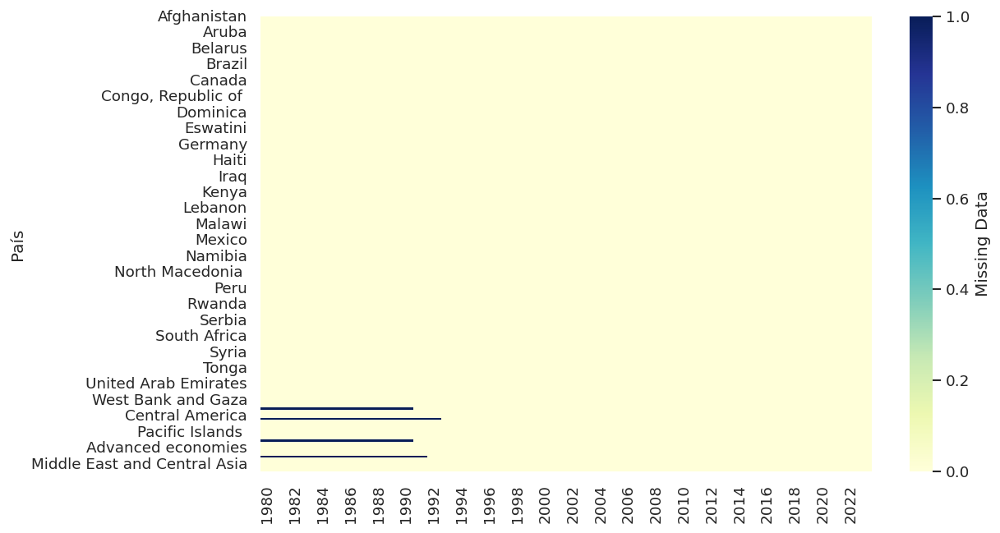

In [120]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df.isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.ylabel("País")

In [132]:
cols_with_missing = df.columns[df.isnull().any()].tolist()
cols_with_missing

['Africa (Region)', 'Central Asia and the Caucasus', 'Sub-Saharan Africa (Region) ', 'Euro area']

- Existem 4 grupos que não tiveram seus valores preenchidos, possivelmente por não pertencerem à nenhum dos grupos analíticos listados acima.
- Vamos então verificar como seus gráficos se comportam

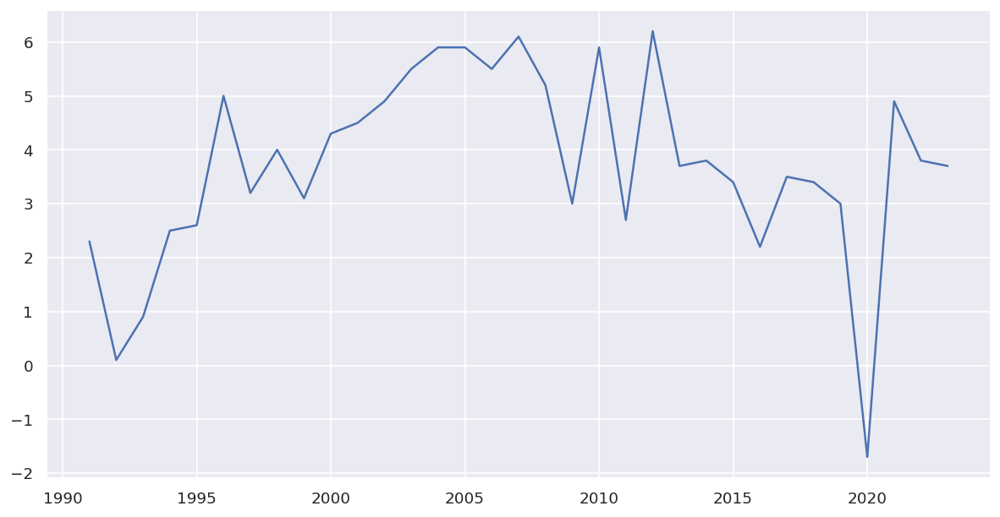

In [134]:
df["Africa (Region)"].plot()

- Temos que a África possui um grande vale no ano da pandemia

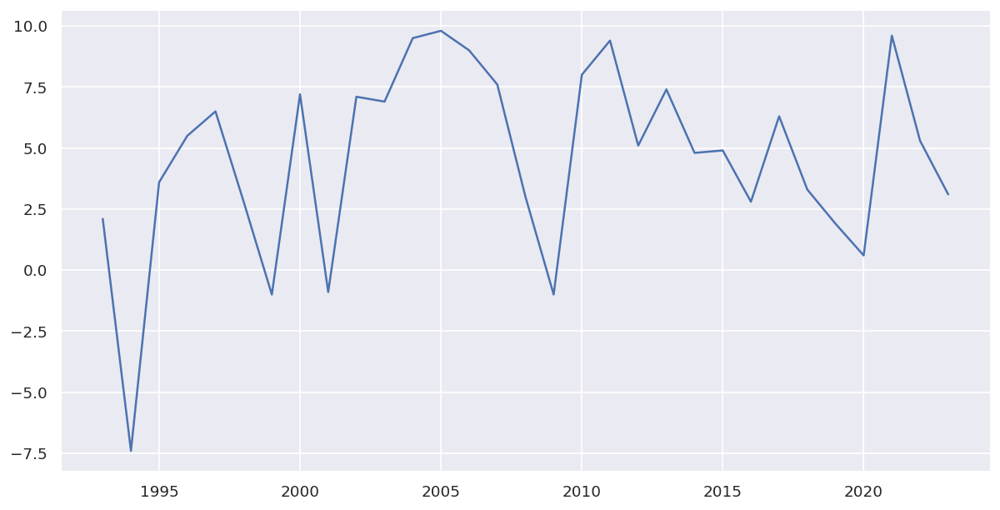

In [135]:
df["Central Asia and the Caucasus"].plot()

- Para a região de "Central Asia and the Caucasus", observamos uma grande queda em 1994.

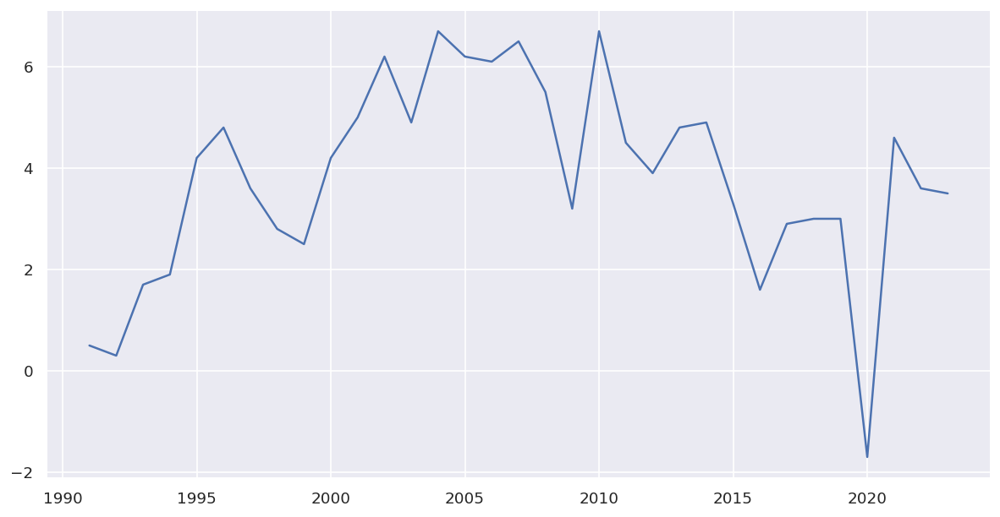

In [136]:
df["Sub-Saharan Africa (Region) "].plot()

- Assim com a África no geral, sua região subsaariana também sofreu uma grande queda na pandemia

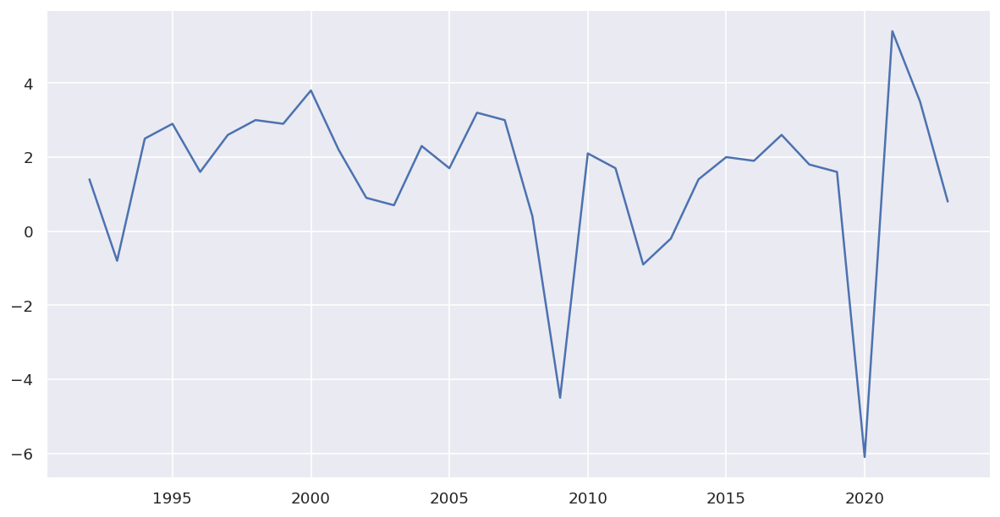

In [137]:
df["Euro area"].plot()

- Também como grandes partes dos países da Europa, temos anomalias nos anos de 2009 e 2020.

- Para os dados da Europa, podemos usar o grupo de "European Union" como base para o preenchimenro dos valores faltantes.
- Para Sub-Saharan Africa (Region), podemos também utilizar o grupo já de definido de "Sub-Saharam" Africa
- Para a região da África, vamos listar alguns países do continete presente no dataset.
- igualmente para "Central Asia and the Caucasus"

In [154]:
missing_countries = {
    "Africa (Region)": [
        "Algeria",
        "Angola",
        "Benin",
        "Botswana",
        "Burkina Faso",
        "Cameroon",
        "Ethiopia",
        "Gabon",
        "Ghana",
        "Guinea",
        "Kenya",
        "Libya",
        "Madagascar",
        "Mali",
        "Morocco",
        "Mozambique",
        "Niger",
        "Nigeria",
        "Senegal",
        "South Africa",
        "Sudan",
        "Tanzania",
        "Tunisia",
        "Uganda",
        "Zambia",
        "Zimbabwe",
        "Africa (Region)"
    ],
    "Central Asia and the Caucasus": [
        "Kazakhstan",
        "Tajikistan",
        "Turkmenistan",
        "Uzbekistan",
        "Armenia",
        "Georgia",
        "Central Asia and the Caucasus",
    ]
}

#### África (Region)

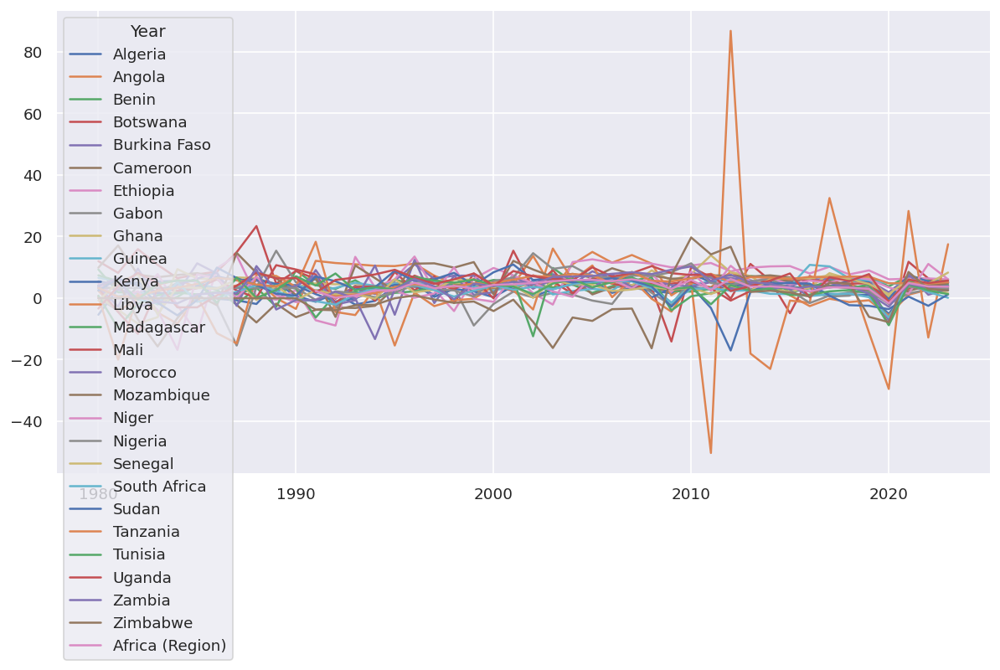

In [148]:
df[missing_countries["Africa (Region)"]].plot()

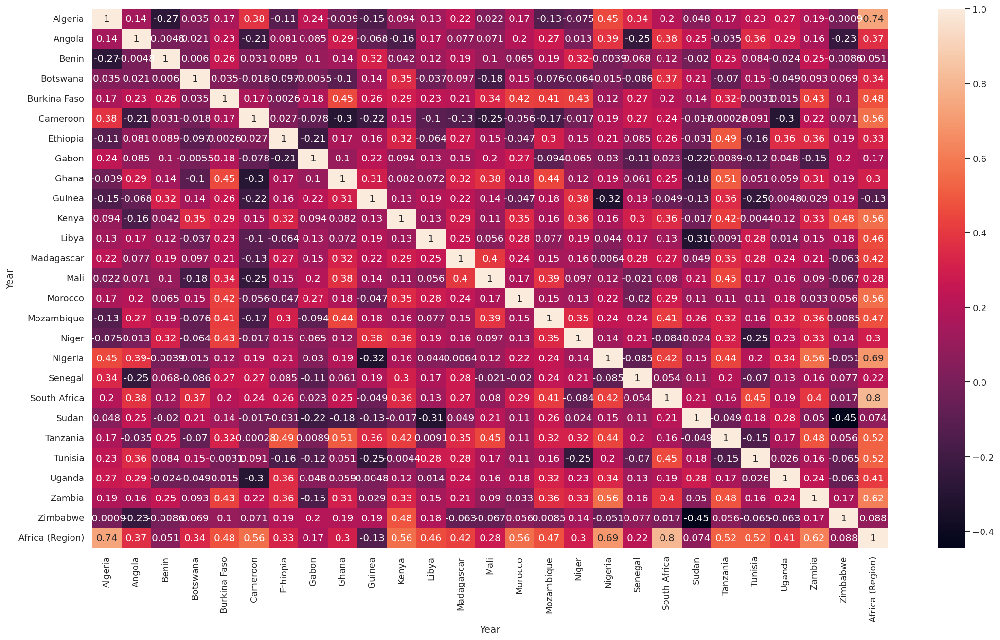

In [149]:
plt.figure(figsize=(22,12))
sns.heatmap(df[missing_countries["Africa (Region)"]].corr(), annot=True)
plt.show()

- Podemos notar uma alta correlação com a África do Sul

In [150]:
df = fill_missing_values_model(df, 
                          missing_countries["Africa (Region)"], 
                          "Africa (Region)", 
                          [2020])

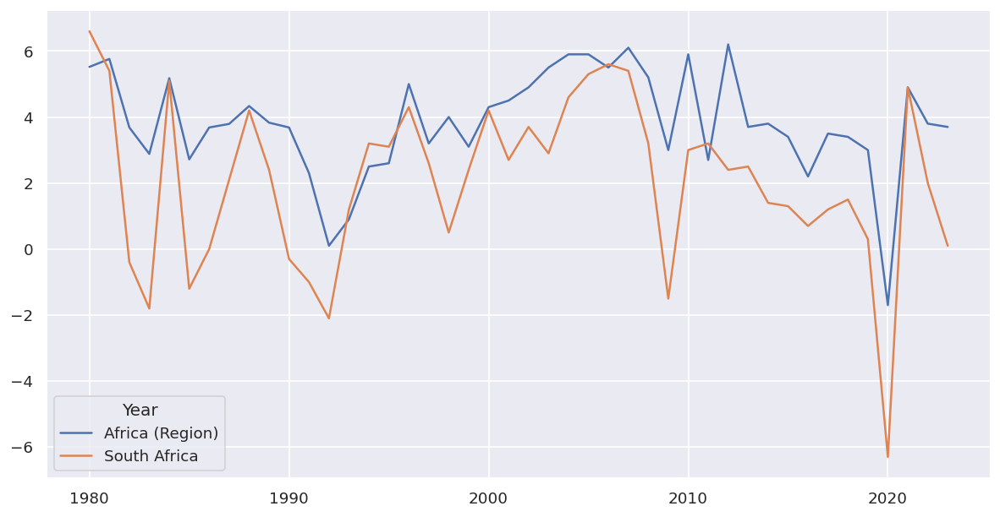

In [152]:
df[["Africa (Region)", "South Africa"]].plot()

#### Central Asia and the Caucasus

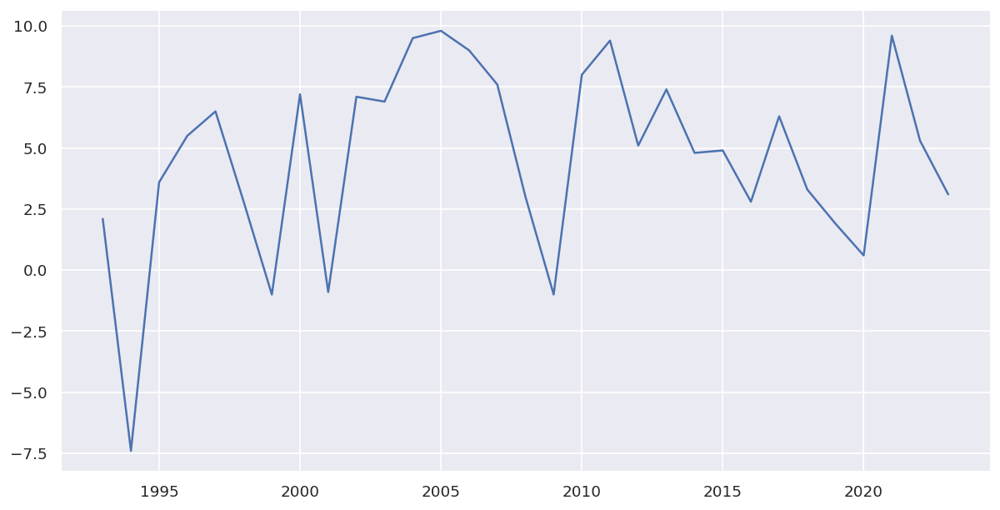

In [156]:
df["Central Asia and the Caucasus"].plot()

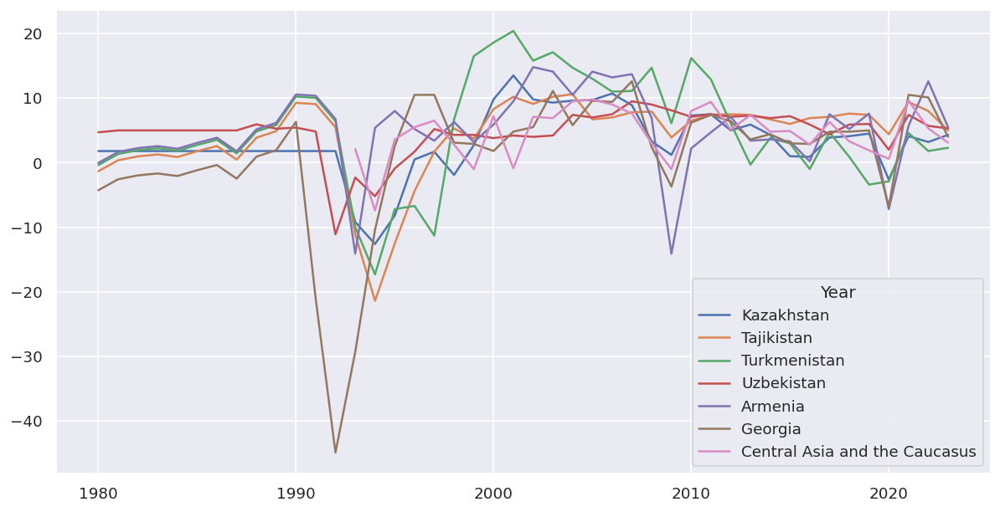

In [155]:
df[missing_countries["Central Asia and the Caucasus"]].plot()

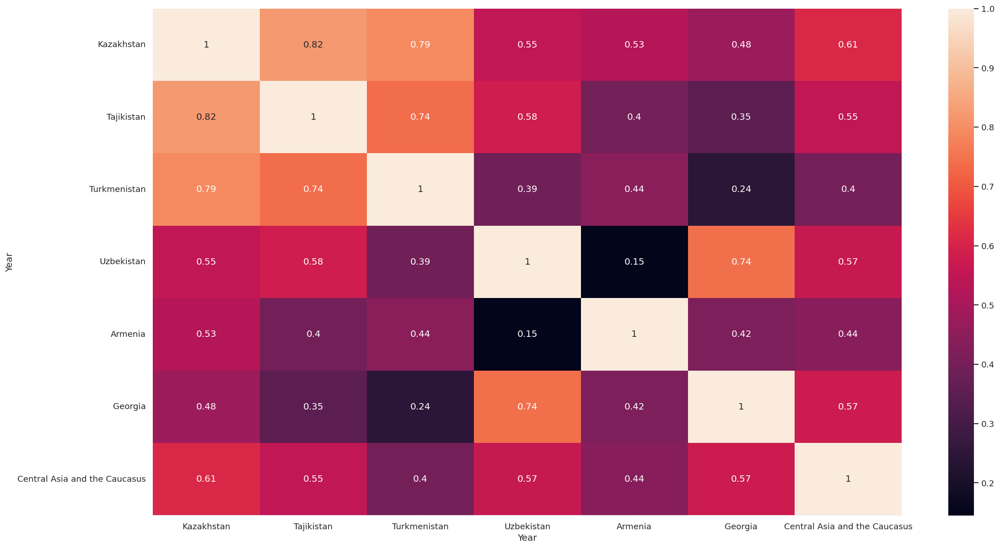

In [157]:
plt.figure(figsize=(22,12))
sns.heatmap(df[missing_countries["Central Asia and the Caucasus"]].corr(), annot=True)
plt.show()

- Aqui podemos notar uma exceção pois grande parte dos países observados fazem parte do grupo de Emerging market and developing economies, onde seus próprios valores não estavam completos.

In [158]:
df = fill_missing_values_model(df, 
                          missing_countries["Central Asia and the Caucasus"], 
                          "Central Asia and the Caucasus", 
                          [1994])

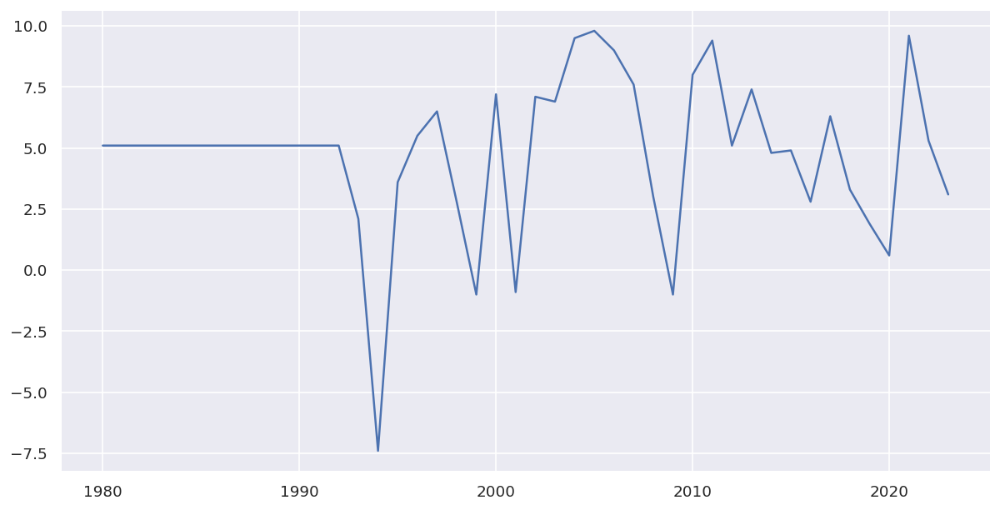

In [159]:
df["Central Asia and the Caucasus"].plot()

#### Sub-Saharan Africa (Region) 

In [162]:
analytical_group["Sub-Saharan Africa"].append("Sub-Saharan Africa (Region) ")

In [165]:
df = fill_missing_values_model(df, 
                          analytical_group["Sub-Saharan Africa"], 
                          "Sub-Saharan Africa", 
                          [2020])

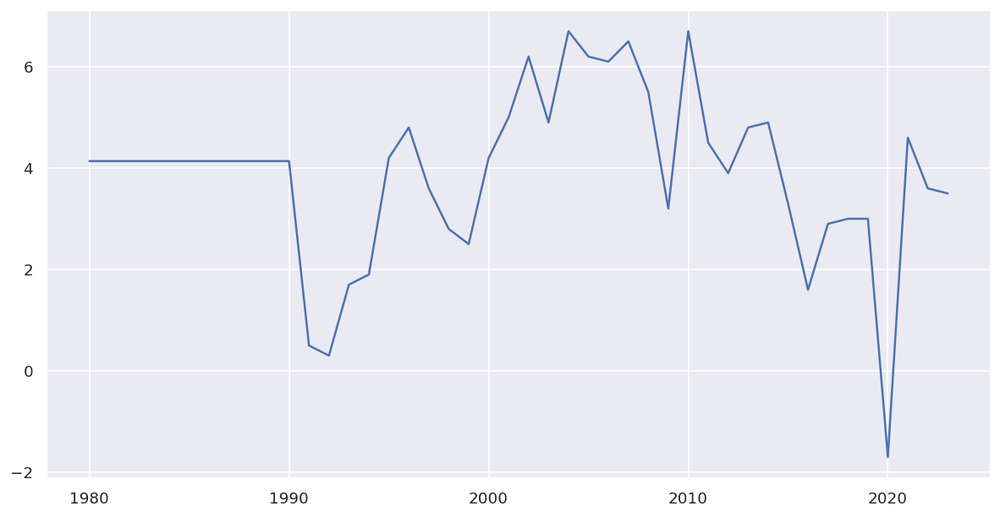

In [166]:
df["Sub-Saharan Africa (Region) "].plot()

#### Euro Area

In [172]:
analytical_group["European Union"].append("Euro area")

In [173]:
df = fill_missing_values_model(df, 
                          analytical_group["European Union"], 
                          "European Union", 
                          [2009, 2020])

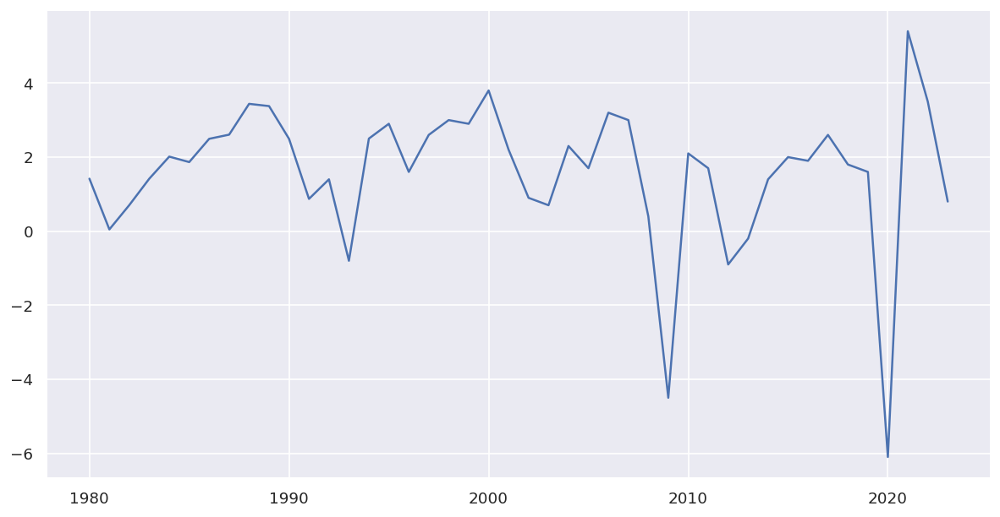

In [174]:
df["Euro area"].plot()

### Checagem se todos os valores faltantes foram preenchidos

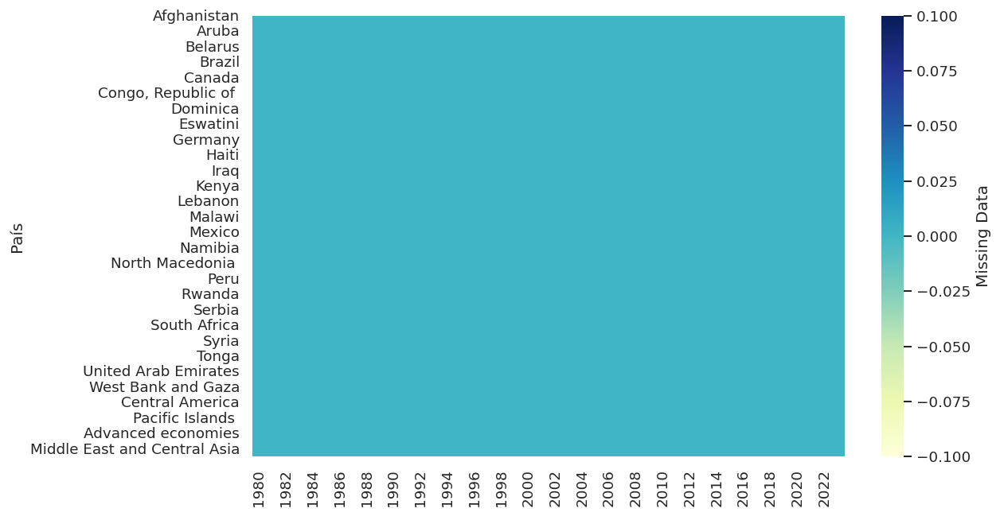

In [175]:
sns.set(rc={'figure.dpi': 120, 'figure.figsize': (12, 6)})
plt.figure(figsize=(10,6))
sns.heatmap(df.isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})
plt.ylabel("País")

### Salvar dados de input para o modelo

In [179]:
df.to_csv("data/05_model_input/data.csv", index="False")